In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import celloracle as co
import os
import seaborn as sns
import scanpy.external as sce
import omicverse as ov
import cospar as cs


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.3, Tutorials: https://omicverse.readthedocs.io/


In [66]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline

... storing 'celltype' as categorical


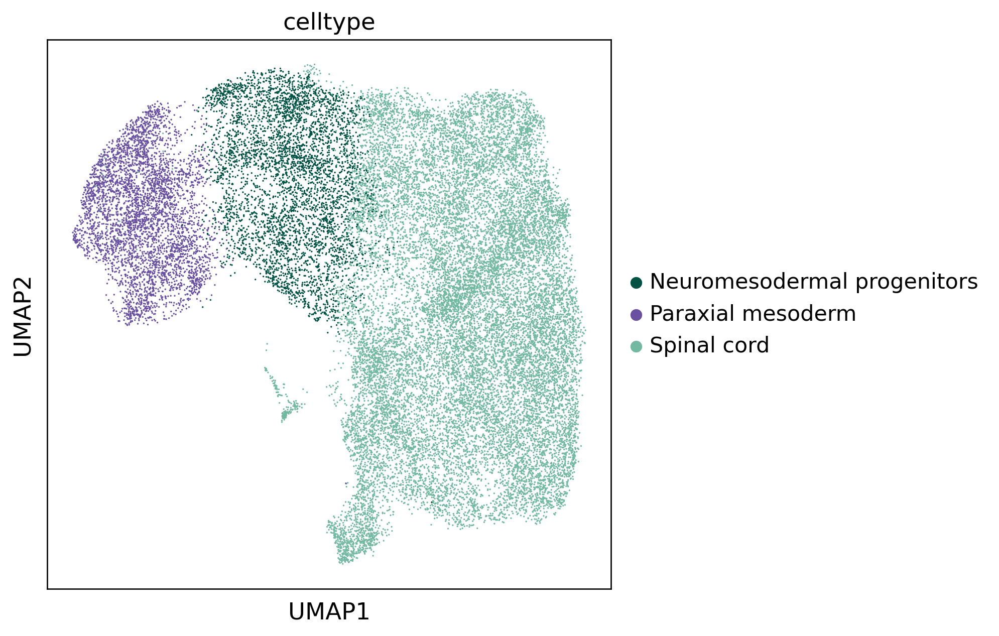

In [70]:
adata = sc.read_h5ad('/data/jiangjunyao/polyATAC/nmp_all.h5ad')
sc.pp.neighbors(adata,use_rep='X_scvi')
sc.pl.umap(adata,color='celltype')

In [72]:
cs.pp.get_X_clone(adata,clone_data_barcode_id=adata.obs['rare_barcodes'],clone_data_cell_id=adata.obs_names)
adata.obsm['X_emb'] = adata.obsm['X_umap']
adata.obsm['X_pca'] = adata.obsm['X_scvi']
adata.obs['state_info'] = adata.obs['celltype']

100%|██████████| 2840/2840 [00:00<00:00, 812428.27it/s]

reorder clones


In [73]:
adata.obs.state_info.value_counts()

Spinal cord                    20654
Neuromesodermal progenitors     4583
Paraxial mesoderm               4396
Name: state_info, dtype: int64

In [74]:
time_info = np.array(adata.obs["state_info"])
time_info[time_info != "Neuromesodermal progenitors"] = "late"
time_info[time_info == "Neuromesodermal progenitors"] = "early"
adata.obs["time_info"] = time_info
adata.obs.time_info.value_counts()

late     25050
early     4583
Name: time_info, dtype: int64

In [75]:
adata_orig = cs.pp.initialize_adata_object(adata)

Time points with clonal info: ['early' 'late']


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.40180444717407227
Smooth round: 2
--> Time elapsed: 0.3587825298309326
Smooth round: 3
--> Time elapsed: 2.4592456817626953
Smooth round: 4
--> Time elapsed: 9.263863563537598
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  9.88157606124878
Smooth round: 5
--> Time elapsed: 9.995109558105469
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  9.98105239868164
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.560564041137695
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.119049158

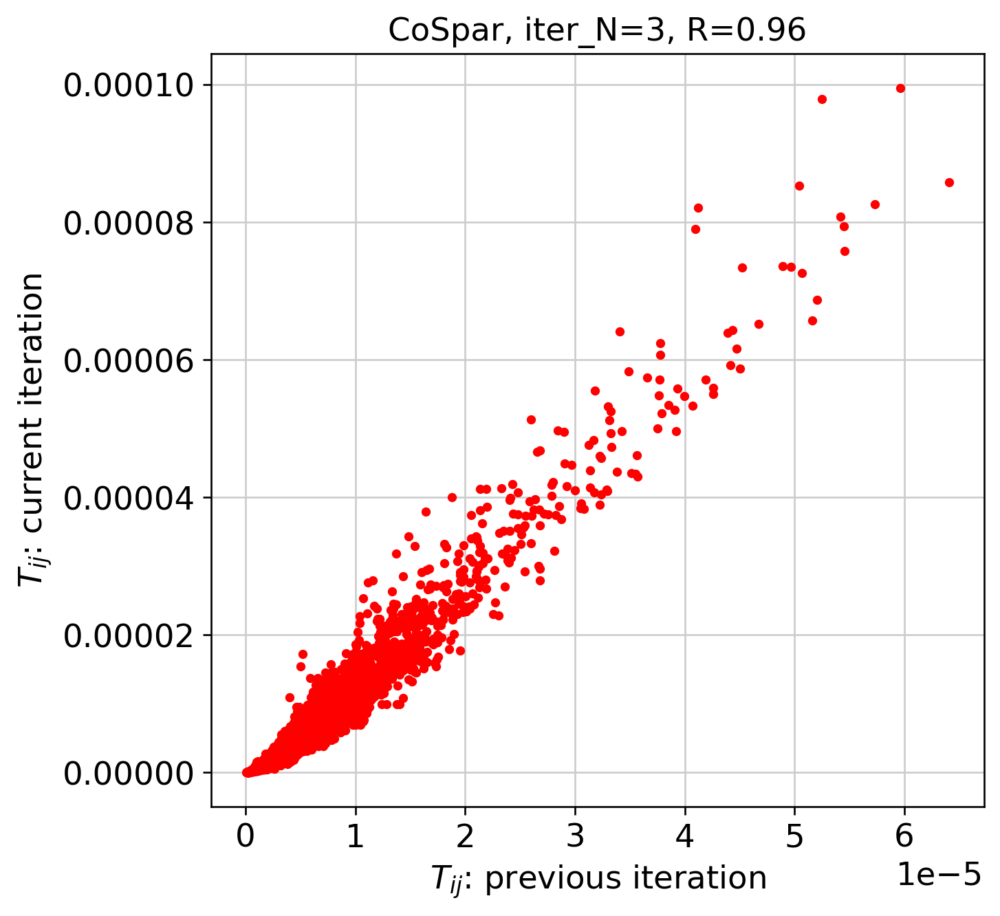

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  1.0267126560211182
--> Phase II: time elapsed --  1.7153172492980957
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


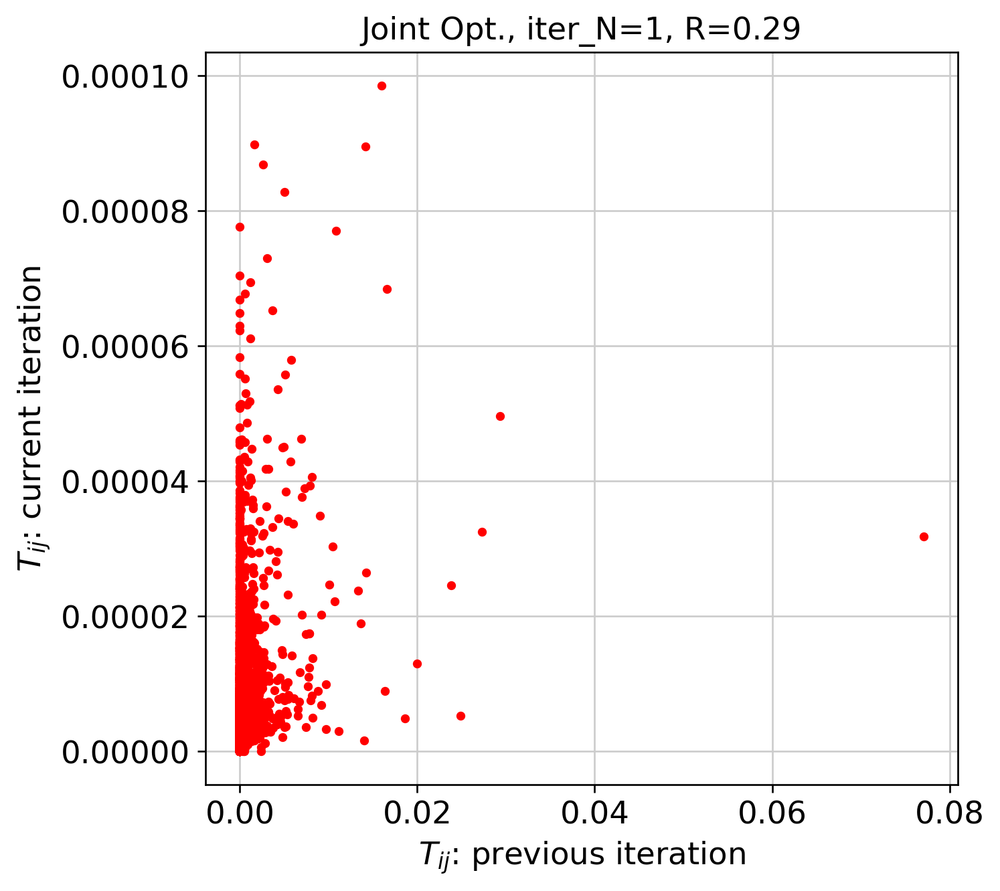

Finishing Joint Optimization, used time 69.0952742099762
-----------Total used time: 1868.1649205684662 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.3938901424407959
Smooth round: 2
--> Time elapsed: 0.3335106372833252
Smooth round: 3
--> Time elapsed: 2.4931437969207764
Smooth round: 4
--> Time elapsed: 9.354492902755737
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  9.908215522766113
Smooth round: 5
--> Time elapsed: 10.093592643737793
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.00418734550476
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.669653415679932
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.1190491

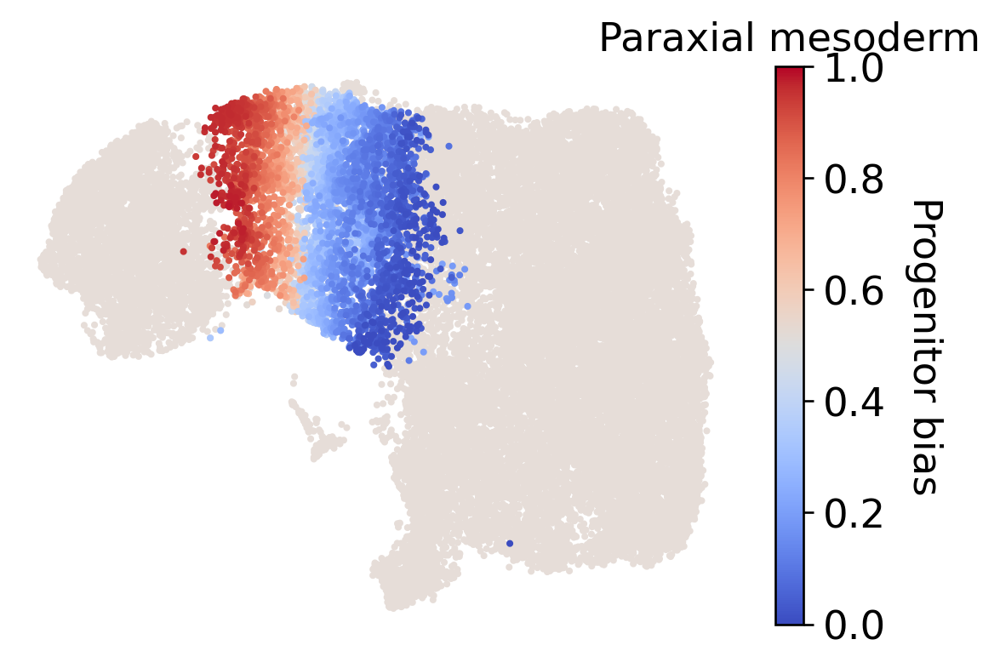

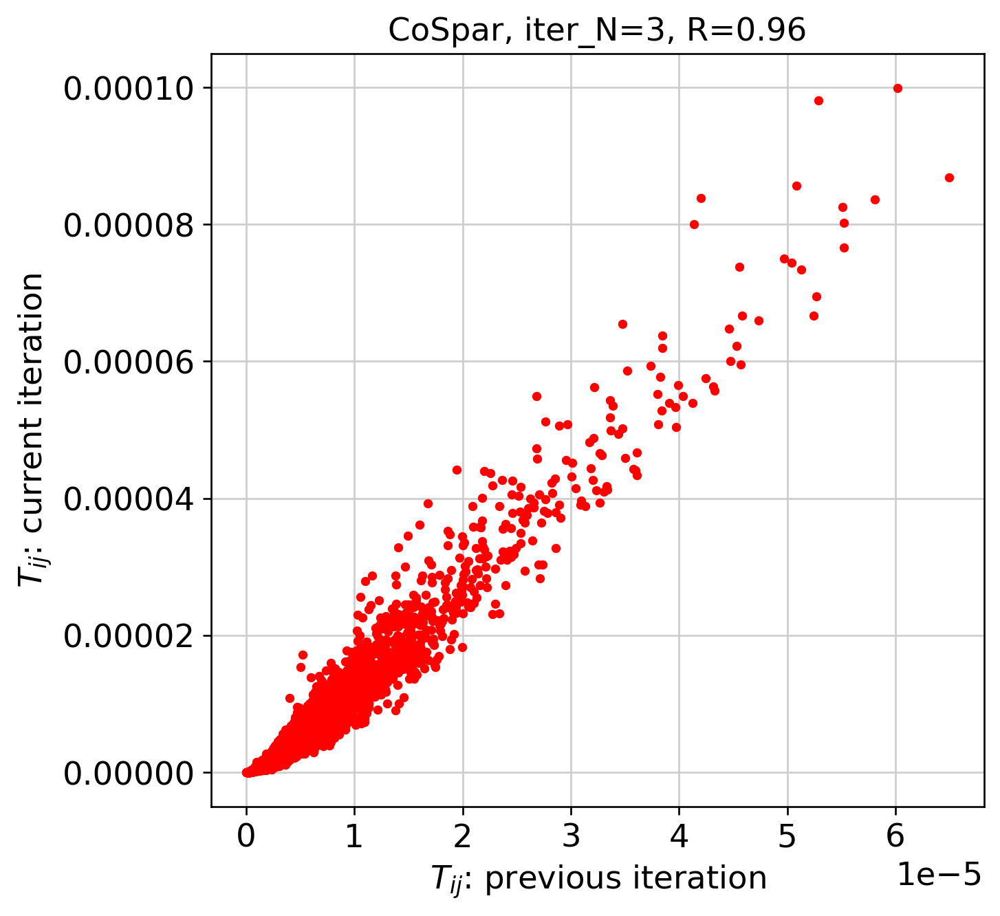

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  1.0529310703277588
--> Phase II: time elapsed --  1.9875609874725342
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


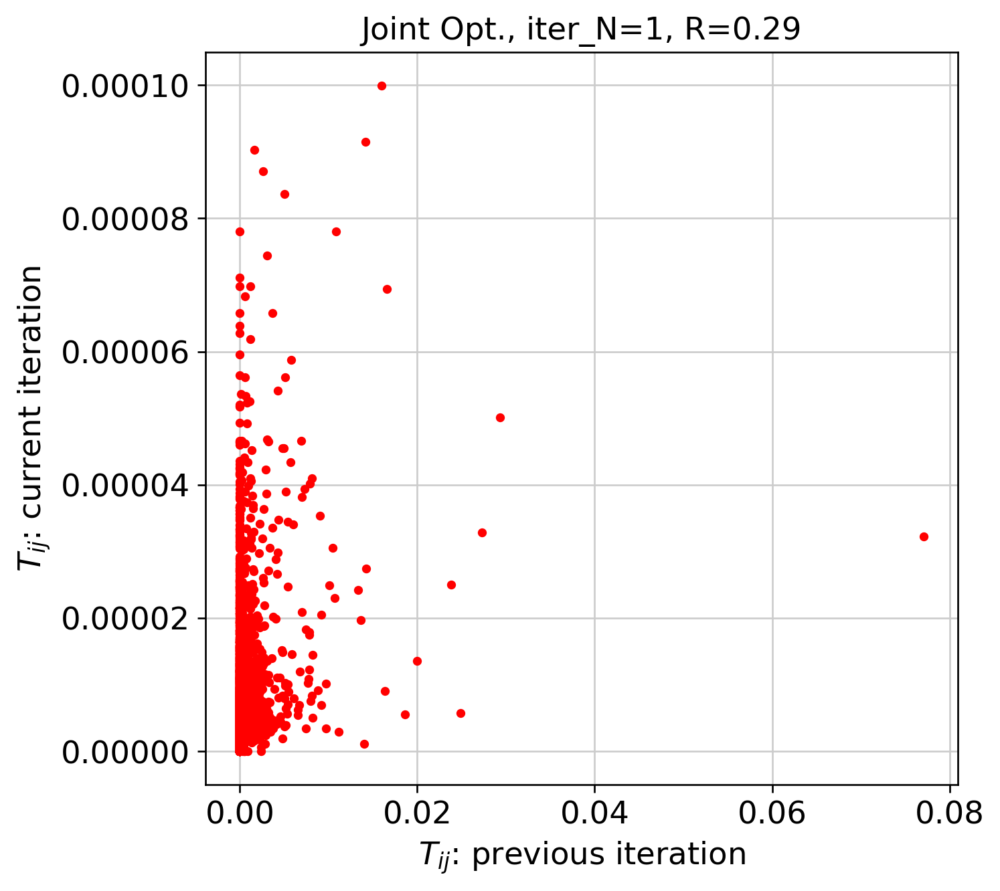

Finishing Joint Optimization, used time 69.81495881080627
-----------Total used time: 1882.402648448944 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.4066643714904785
Smooth round: 2
--> Time elapsed: 0.34719038009643555
Smooth round: 3
--> Time elapsed: 2.5152792930603027
Smooth round: 4
--> Time elapsed: 9.378023386001587
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  10.251357316970825
Smooth round: 5
--> Time elapsed: 10.292702198028564
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.464303493499756
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.739121675491333
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.1190

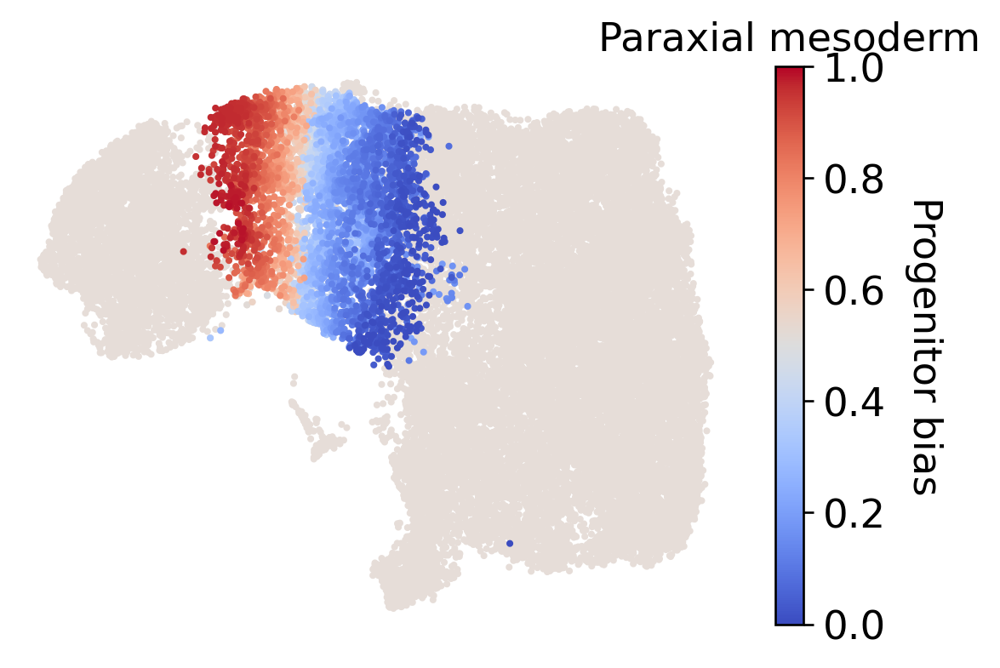

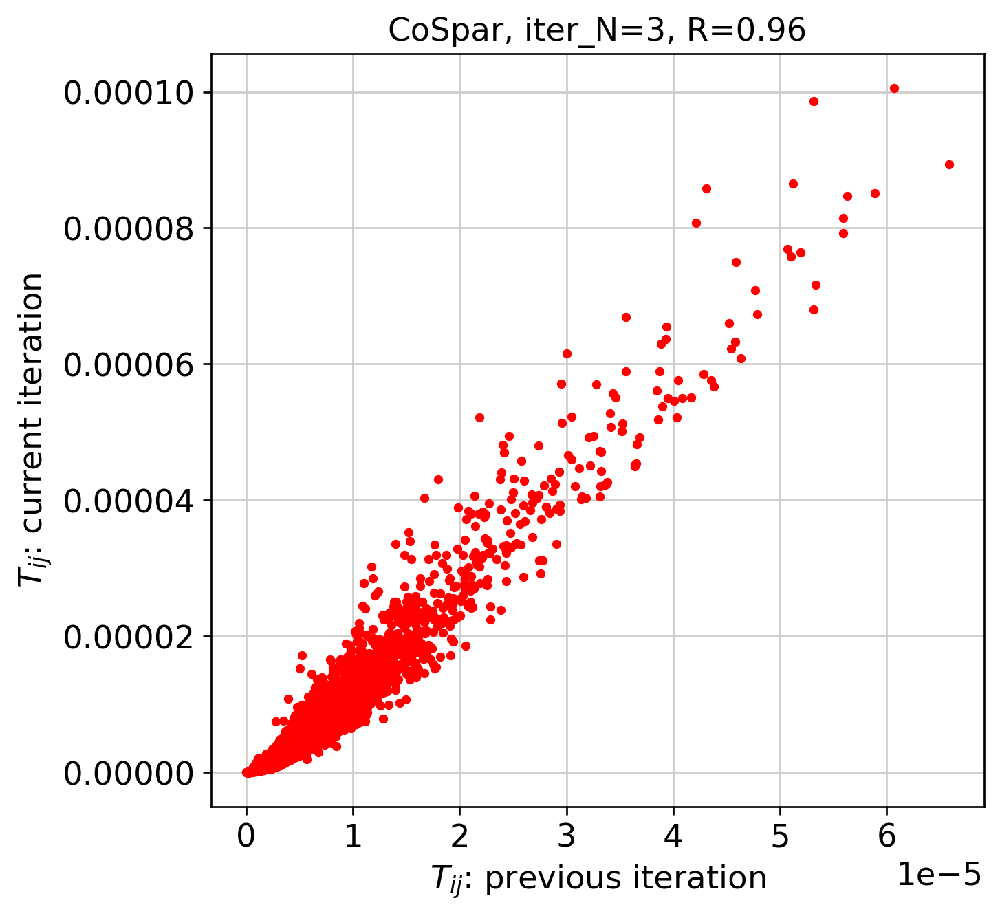

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  1.088031530380249
--> Phase II: time elapsed --  2.1291921138763428
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


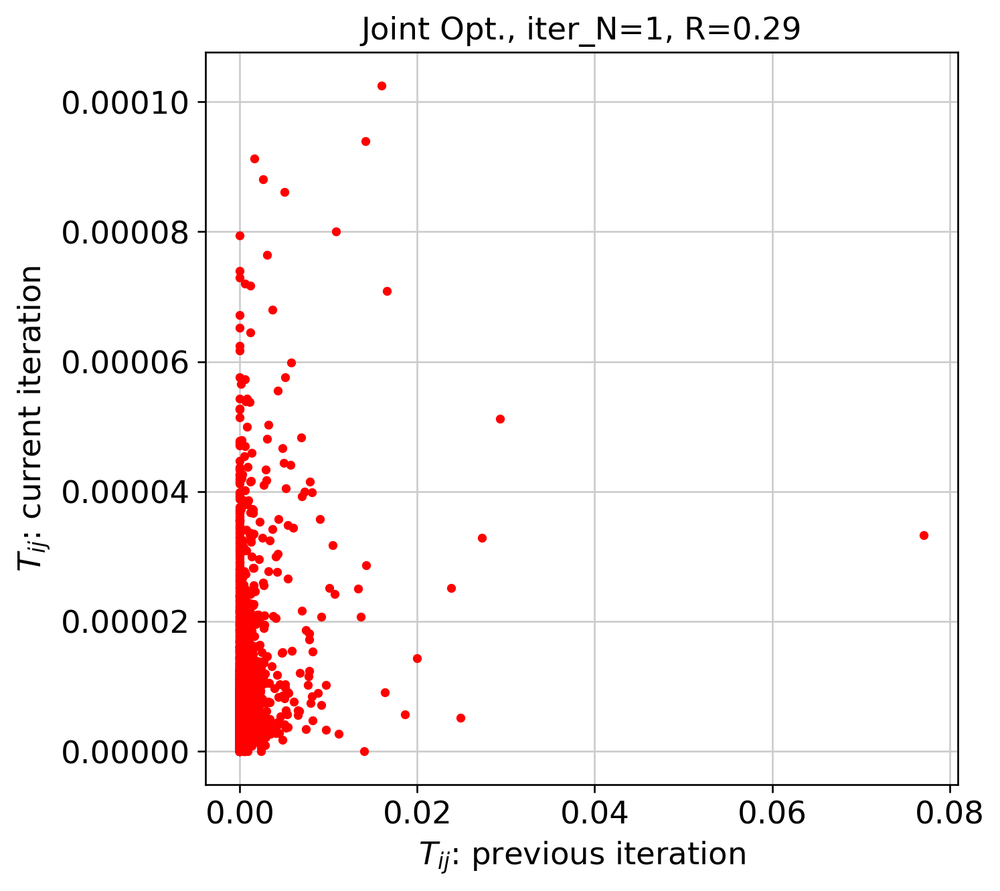

Finishing Joint Optimization, used time 70.35491275787354
-----------Total used time: 1900.695792913437 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.4276456832885742
Smooth round: 2
--> Time elapsed: 0.3609189987182617
Smooth round: 3
--> Time elapsed: 2.5162782669067383
Smooth round: 4
--> Time elapsed: 9.336639165878296
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  10.147826194763184
Smooth round: 5
--> Time elapsed: 10.051974773406982
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.309734106063843
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.64509654045105
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.119049

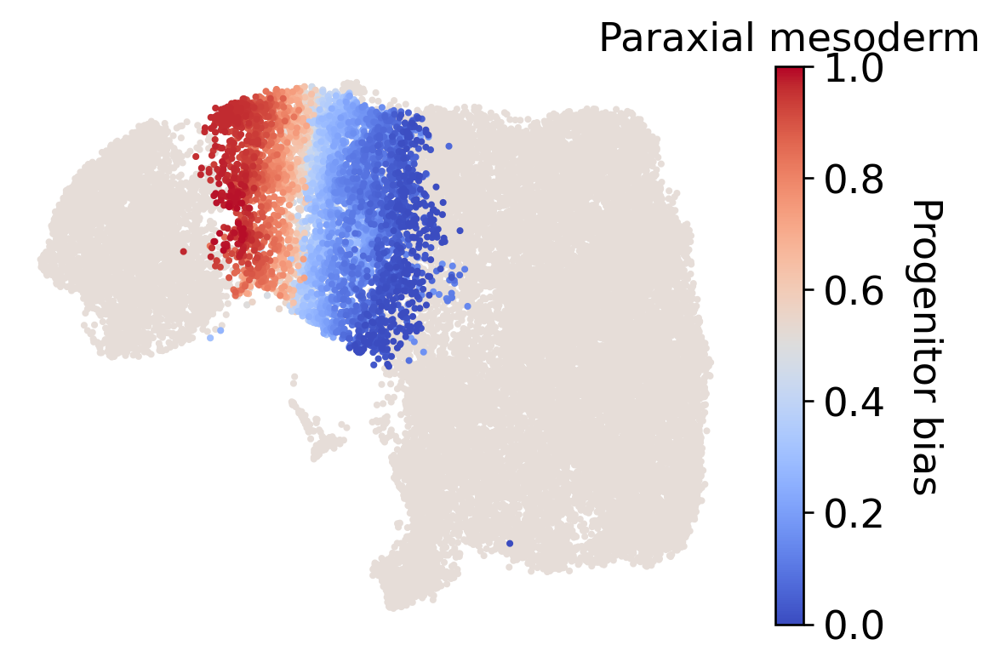

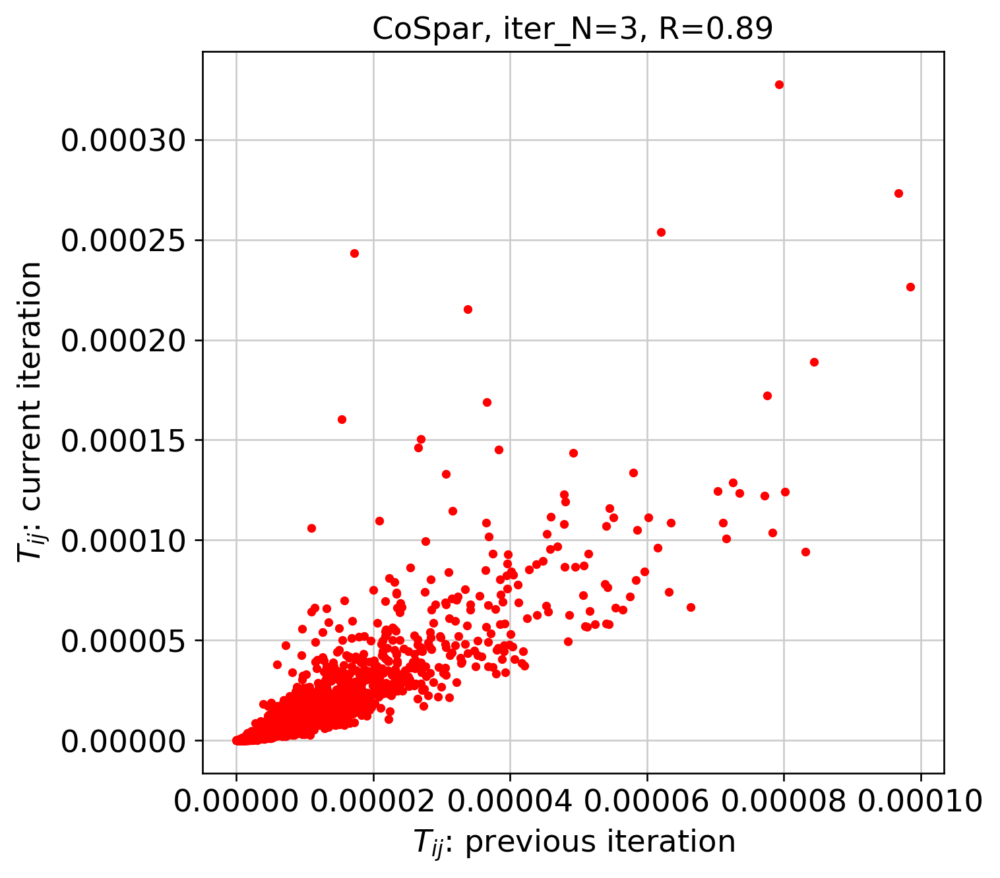

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.09049057960510254
--> Phase II: time elapsed --  0.25000643730163574


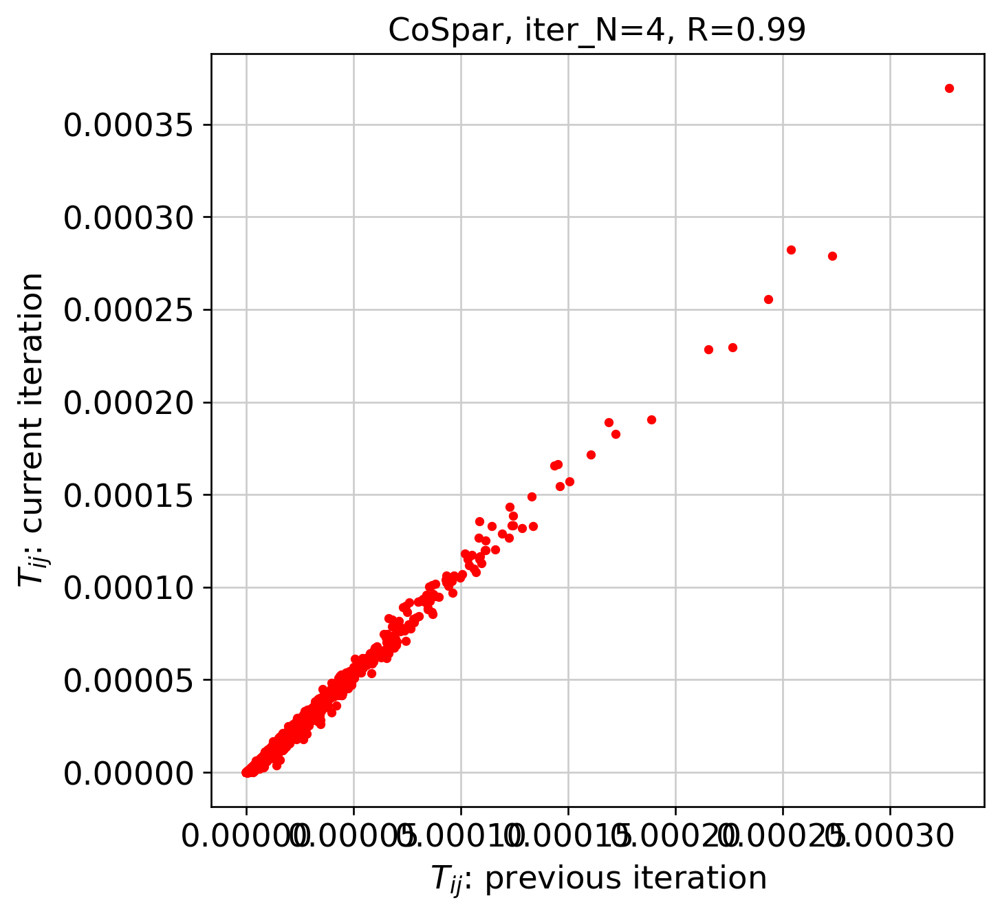

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.8686270713806152
--> Phase II: time elapsed --  1.8080363273620605
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


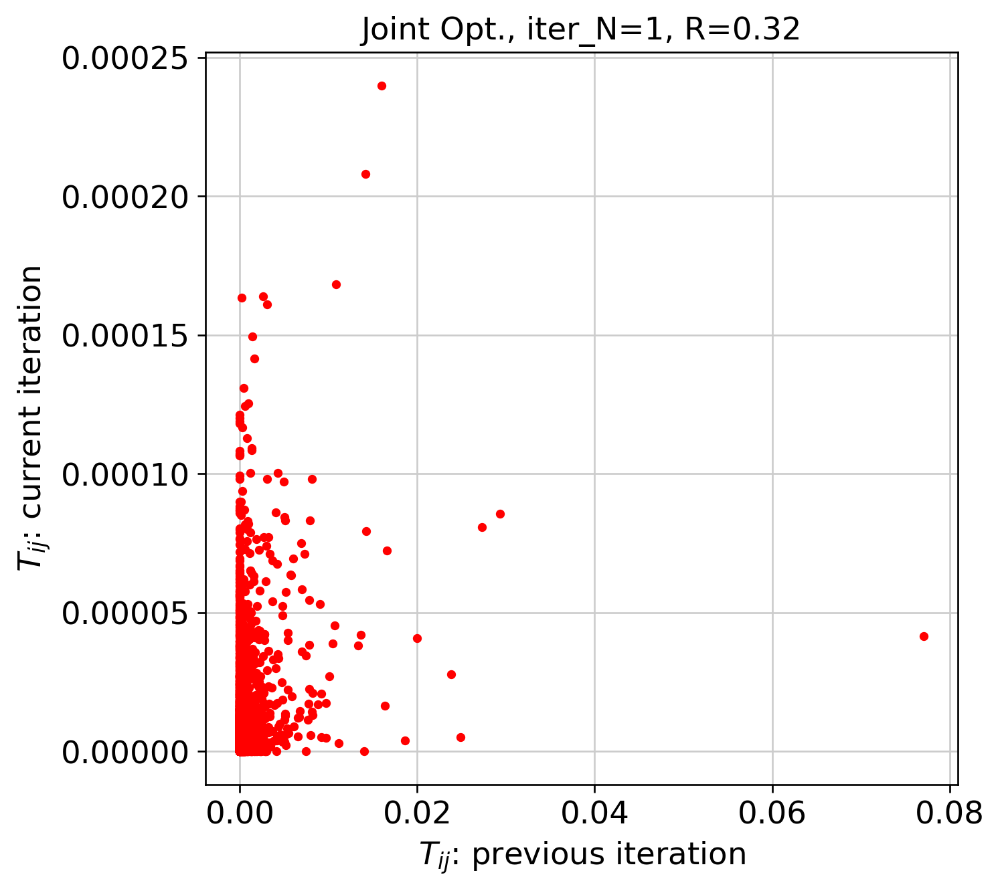

Finishing Joint Optimization, used time 49.67670464515686
-----------Total used time: 1210.2989807128906 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.39929652214050293
Smooth round: 2
--> Time elapsed: 0.33829259872436523
Smooth round: 3
--> Time elapsed: 2.502784013748169
Smooth round: 4
--> Time elapsed: 9.315216541290283
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  9.876172304153442
Smooth round: 5
--> Time elapsed: 10.012311697006226
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  9.99819564819336
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.55621886253357
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.11904915

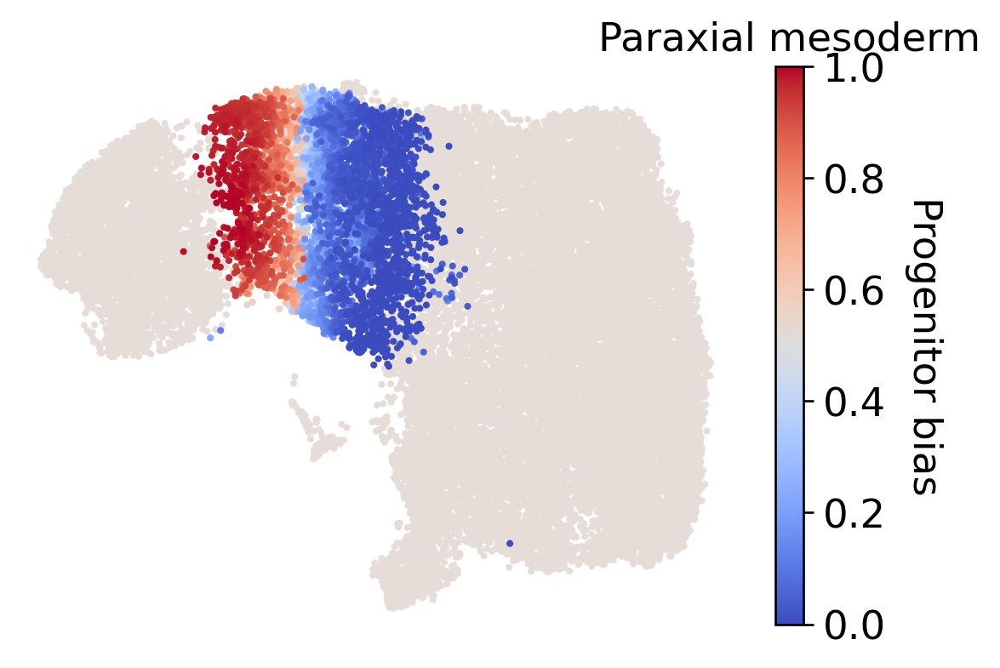

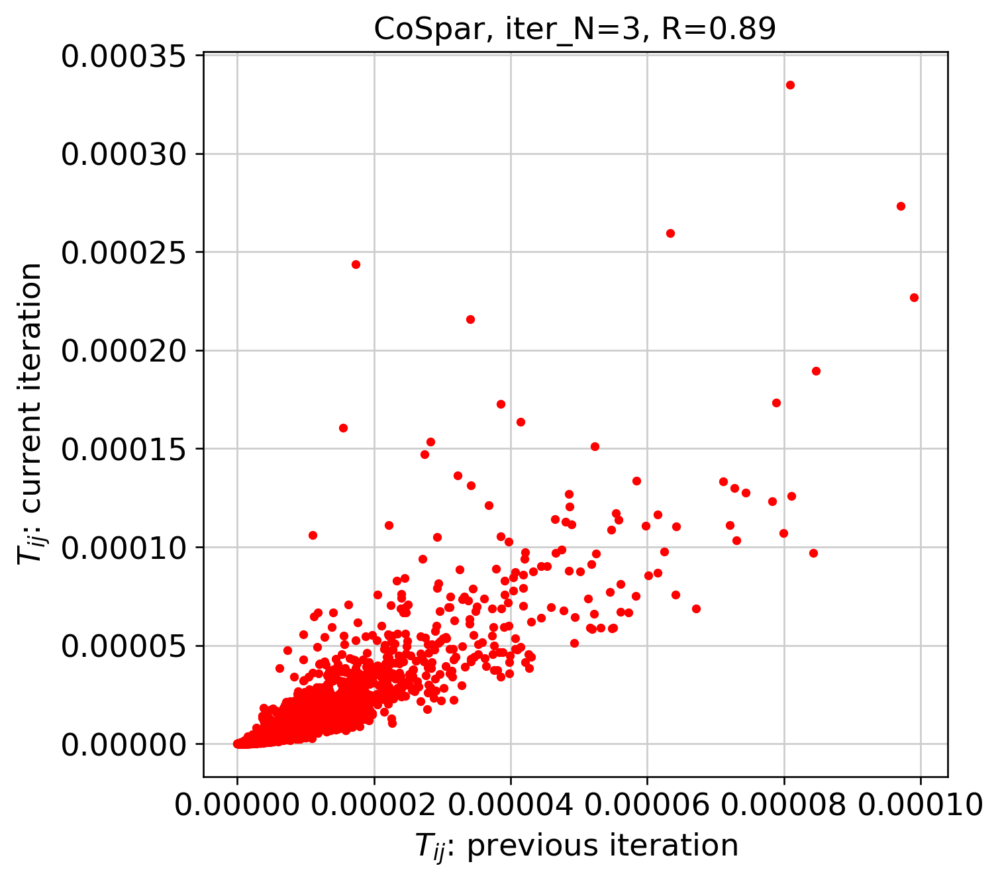

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.08606791496276855
--> Phase II: time elapsed --  0.25000572204589844


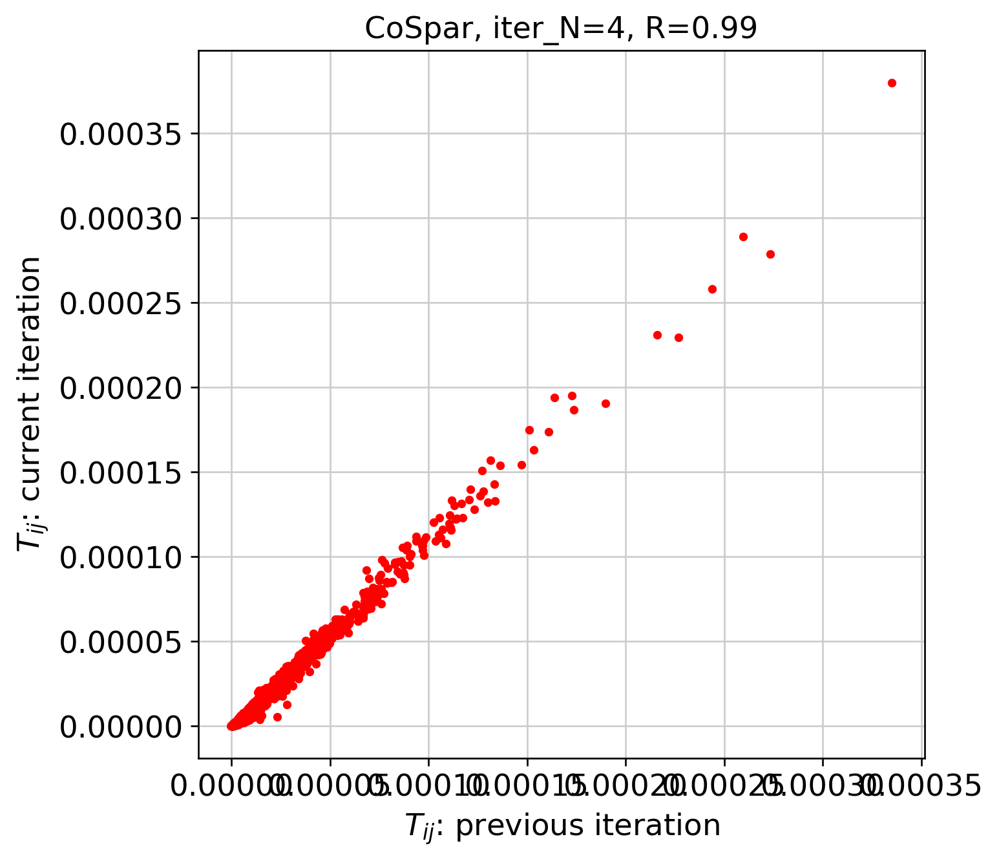

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.8170793056488037
--> Phase II: time elapsed --  1.787682294845581
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


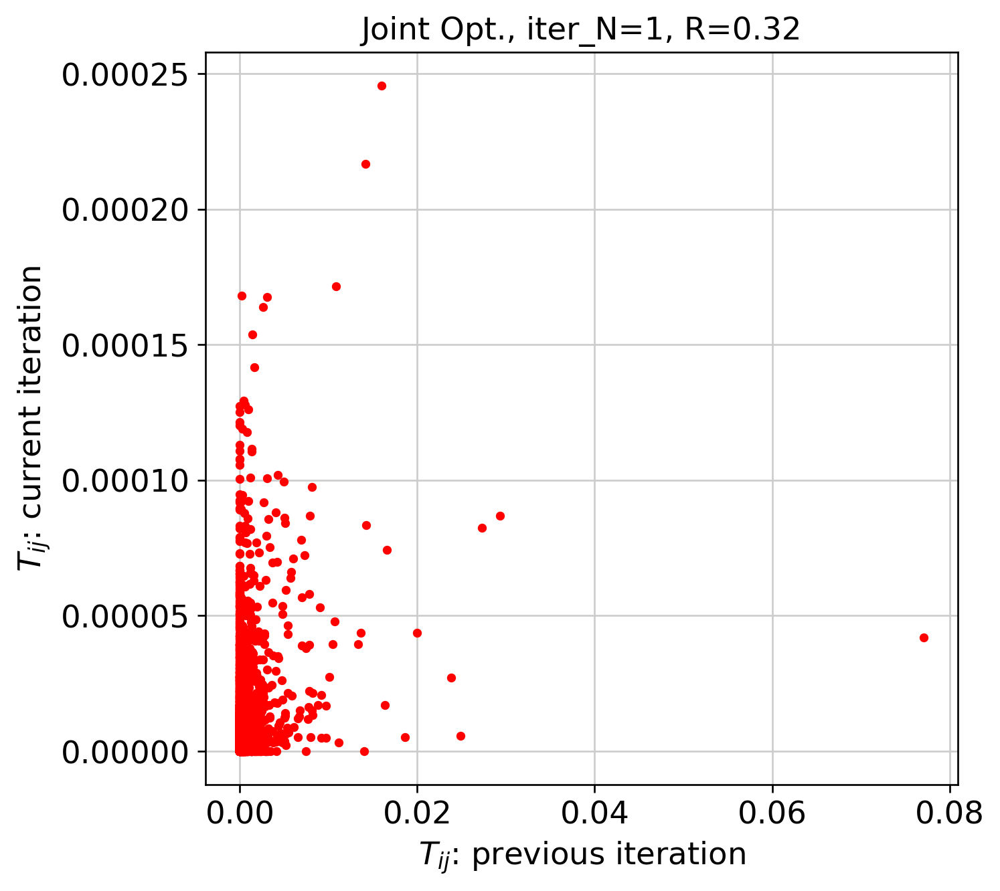

Finishing Joint Optimization, used time 51.3531768321991
-----------Total used time: 1220.864583015442 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.4683725833892822
Smooth round: 2
--> Time elapsed: 0.3559858798980713
Smooth round: 3
--> Time elapsed: 2.5696334838867188
Smooth round: 4
--> Time elapsed: 9.704851388931274
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  10.258949518203735
Smooth round: 5
--> Time elapsed: 10.549273014068604
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.264672994613647
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 14.08859920501709
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.119049

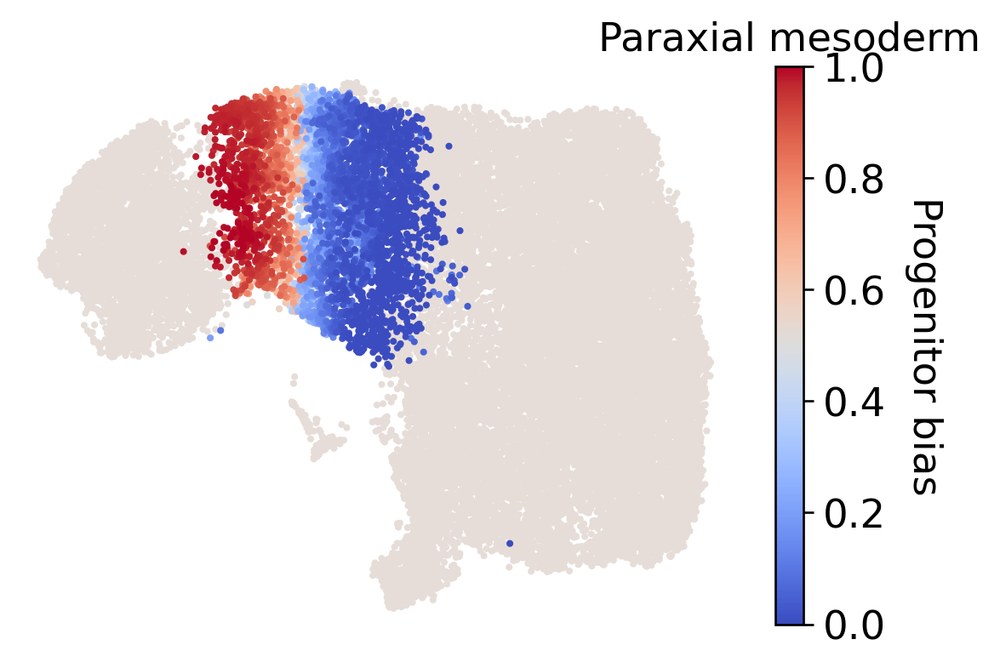

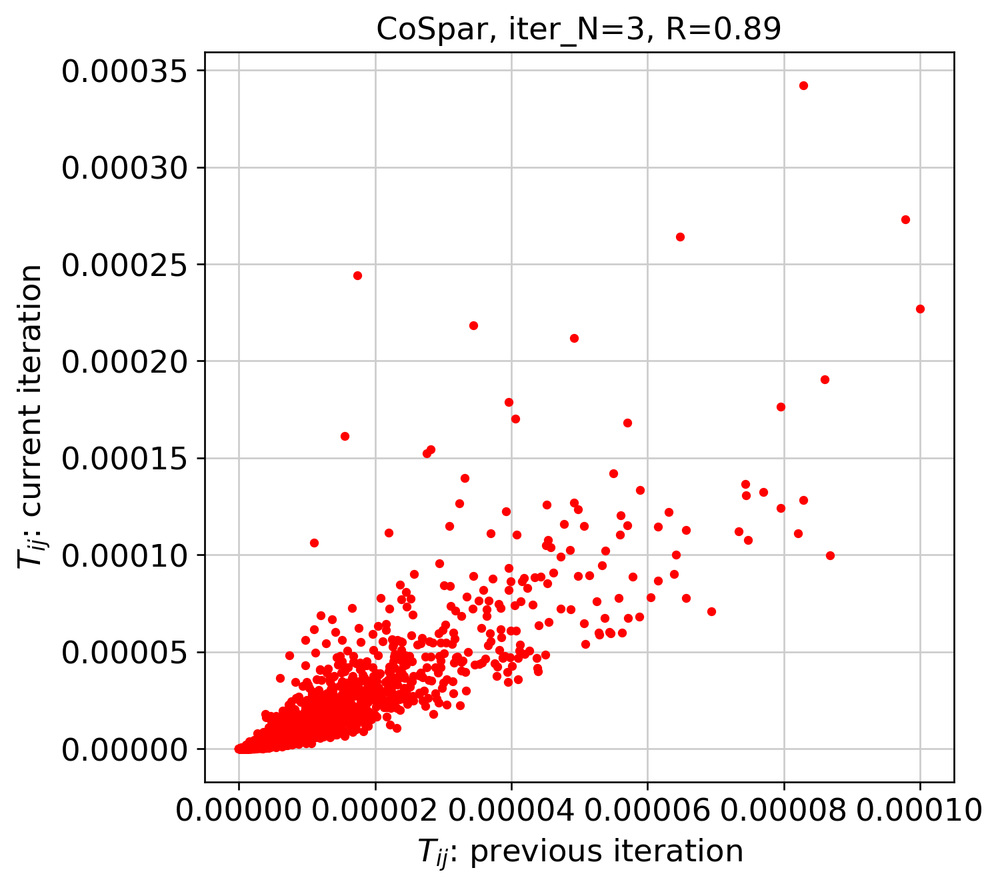

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.08311319351196289
--> Phase II: time elapsed --  0.2613394260406494


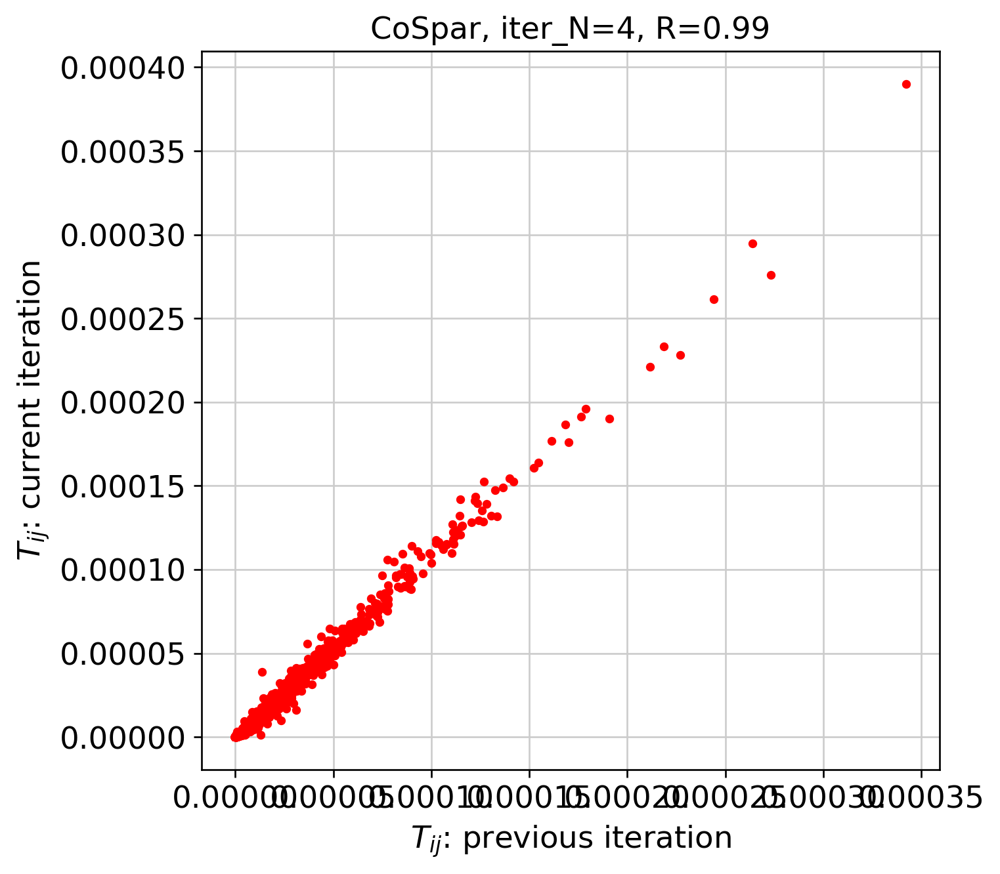

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.7163910865783691
--> Phase II: time elapsed --  1.7238271236419678
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


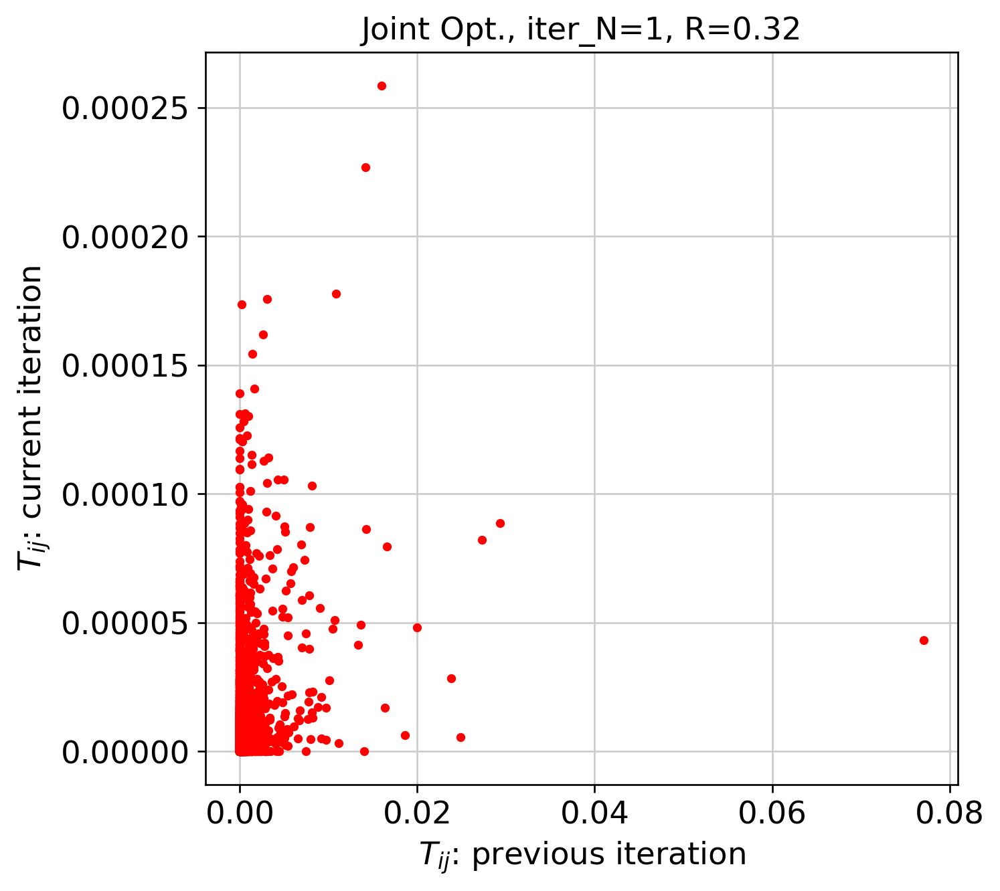

Finishing Joint Optimization, used time 51.51690649986267
-----------Total used time: 1303.7024035453796 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.8998942375183105
Smooth round: 2
--> Time elapsed: 0.37404727935791016
Smooth round: 3
--> Time elapsed: 2.53617000579834
Smooth round: 4
--> Time elapsed: 9.262483358383179
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  10.041806697845459
Smooth round: 5
--> Time elapsed: 9.946985960006714
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.069799661636353
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.582108736038208
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.1190491

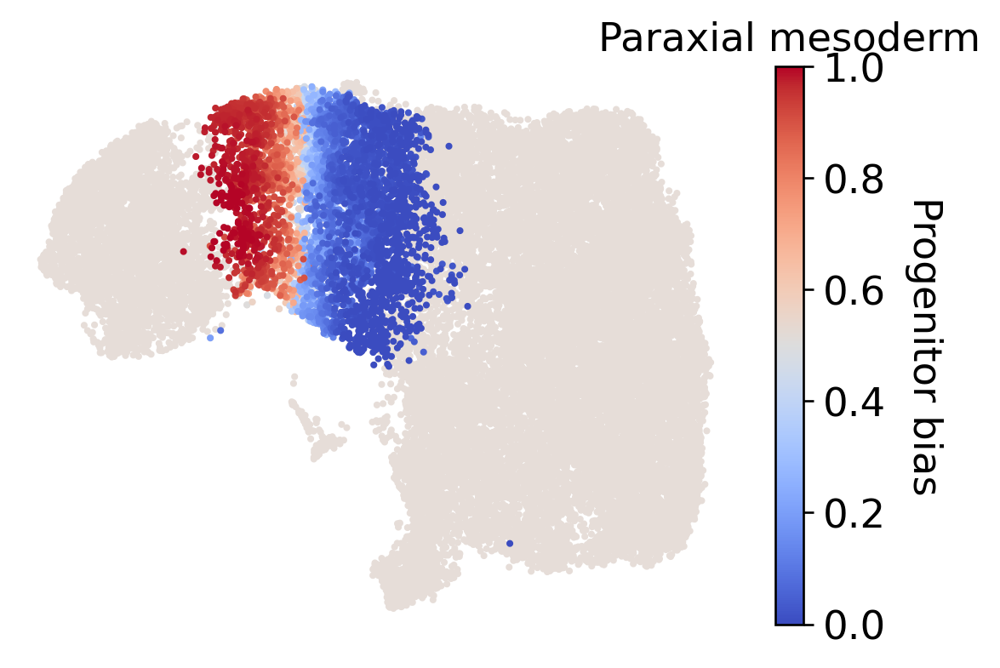

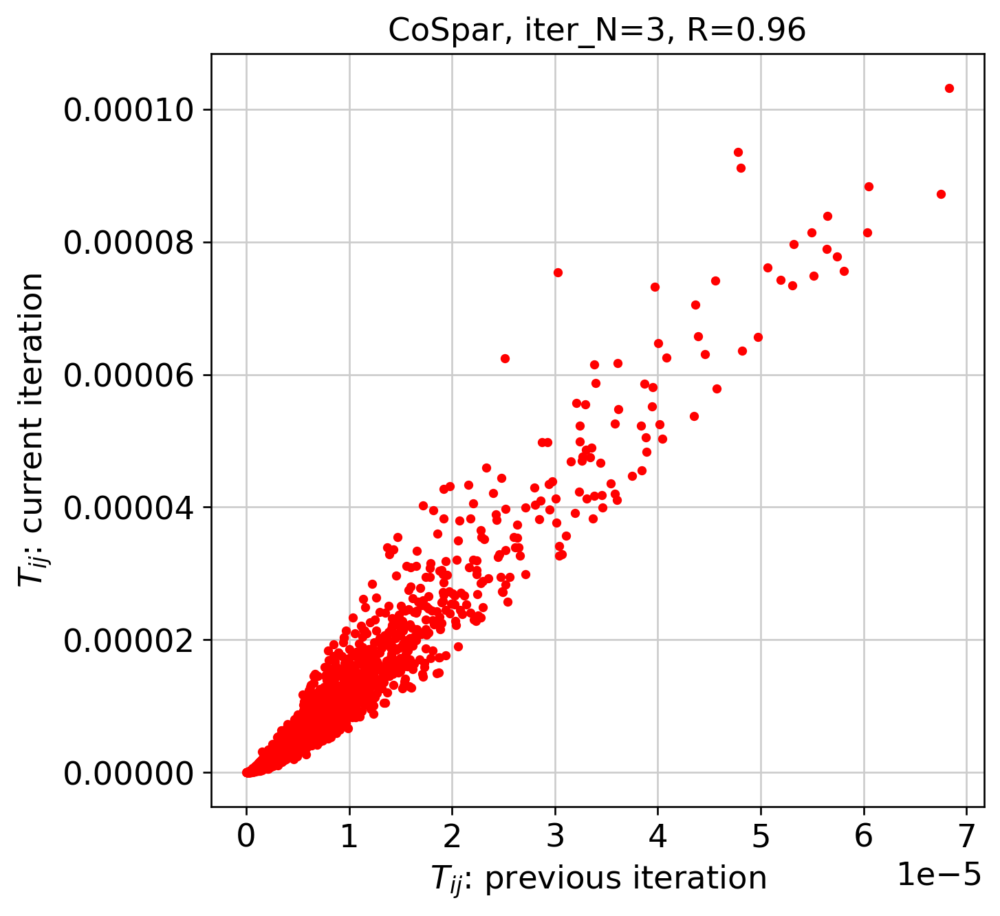

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  1.084348201751709
--> Phase II: time elapsed --  2.031818151473999
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


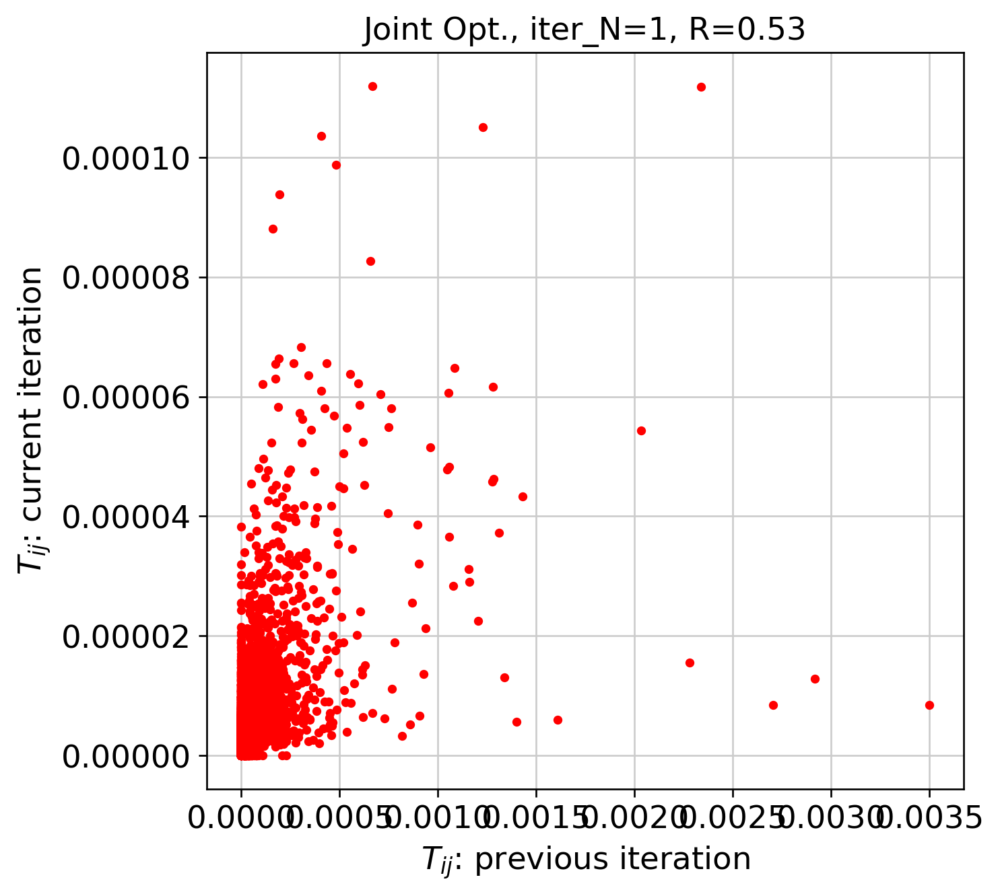

Finishing Joint Optimization, used time 70.0597140789032
-----------Total used time: 2576.2572968006134 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.41169071197509766
Smooth round: 2
--> Time elapsed: 0.357616662979126
Smooth round: 3
--> Time elapsed: 2.5197176933288574
Smooth round: 4
--> Time elapsed: 9.434699058532715
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  9.995155334472656
Smooth round: 5
--> Time elapsed: 10.170594930648804
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.084827661514282
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.607755661010742
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.119049

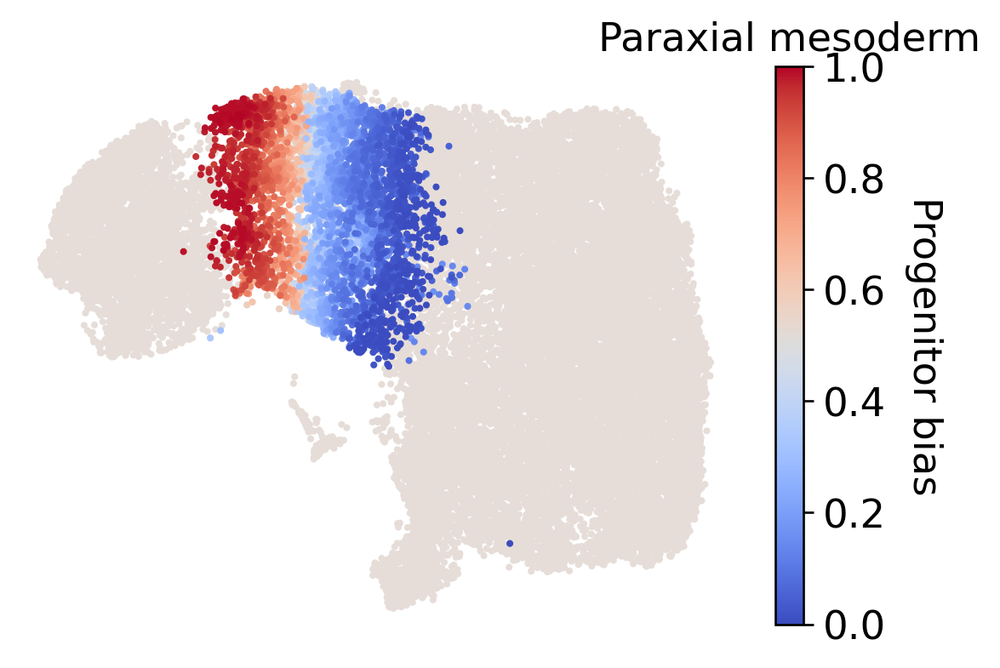

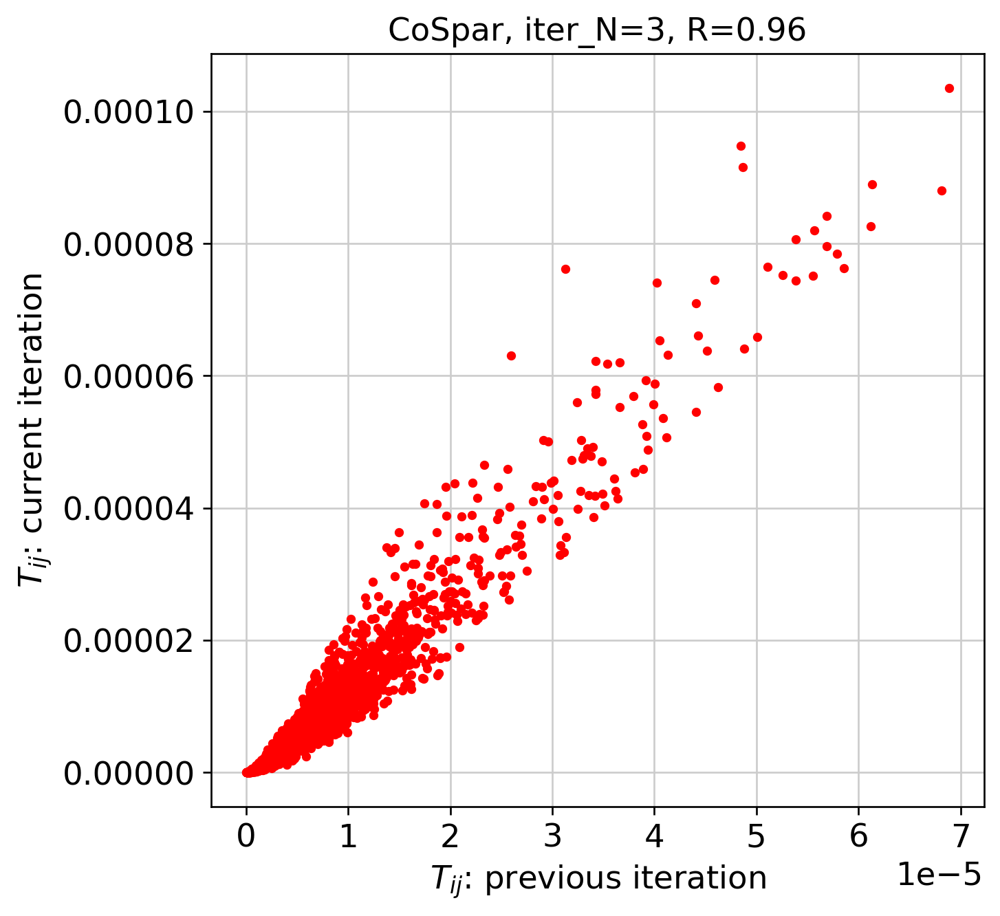

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  1.0458786487579346
--> Phase II: time elapsed --  2.0023274421691895
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


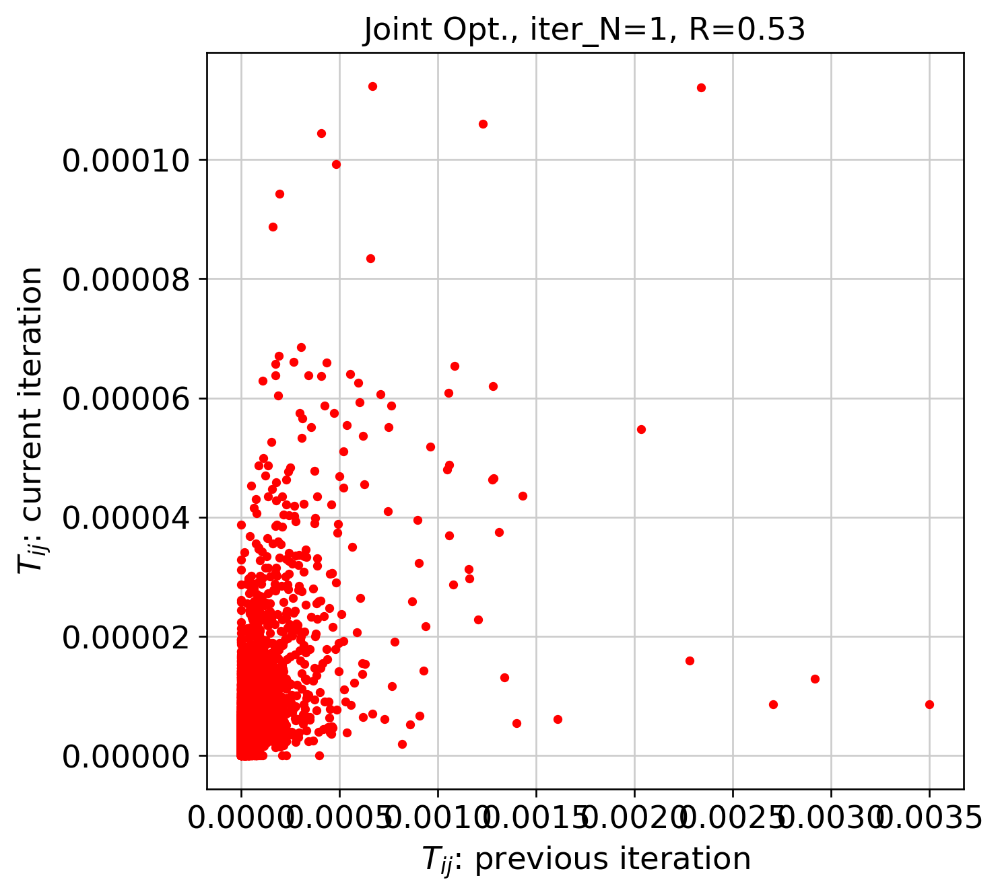

Finishing Joint Optimization, used time 69.59968280792236
-----------Total used time: 2187.238075733185 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.3905026912689209
Smooth round: 2
--> Time elapsed: 0.336470365524292
Smooth round: 3
--> Time elapsed: 2.494171619415283
Smooth round: 4
--> Time elapsed: 9.311047554016113
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  9.829613208770752
Smooth round: 5
--> Time elapsed: 10.083855628967285
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  9.933703184127808
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.561033725738525
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.119049158

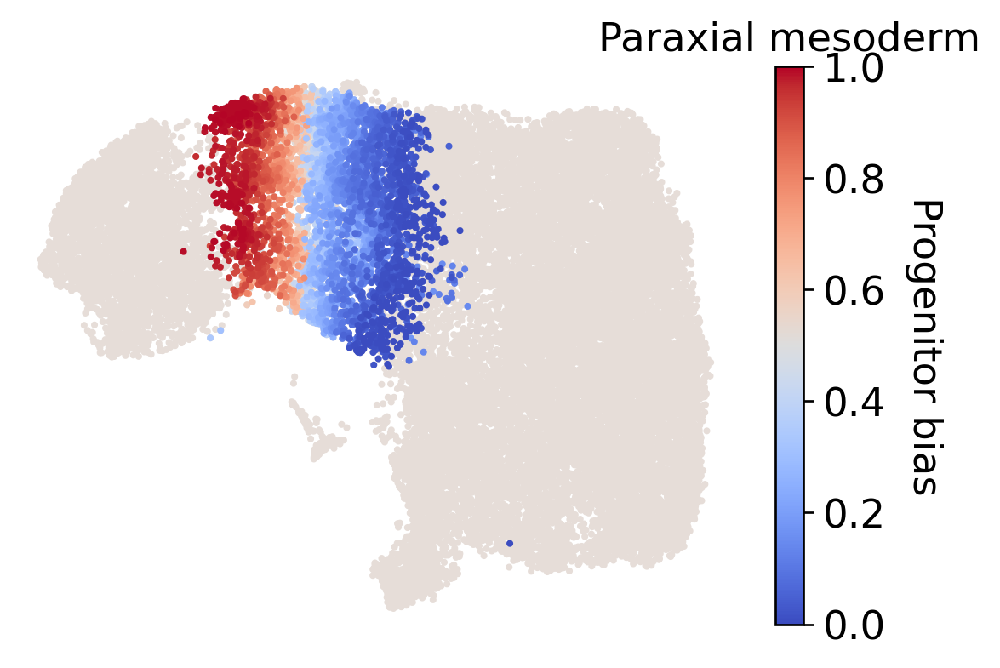

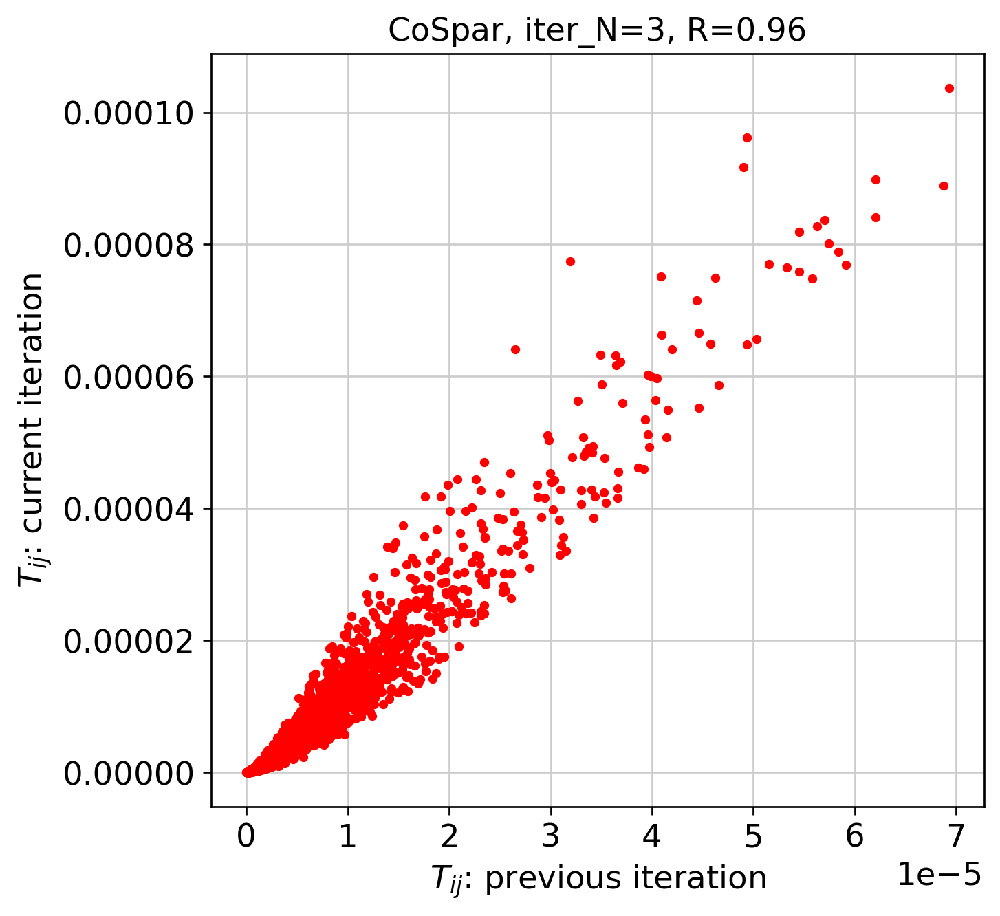

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  1.0165395736694336
--> Phase II: time elapsed --  1.986057996749878
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


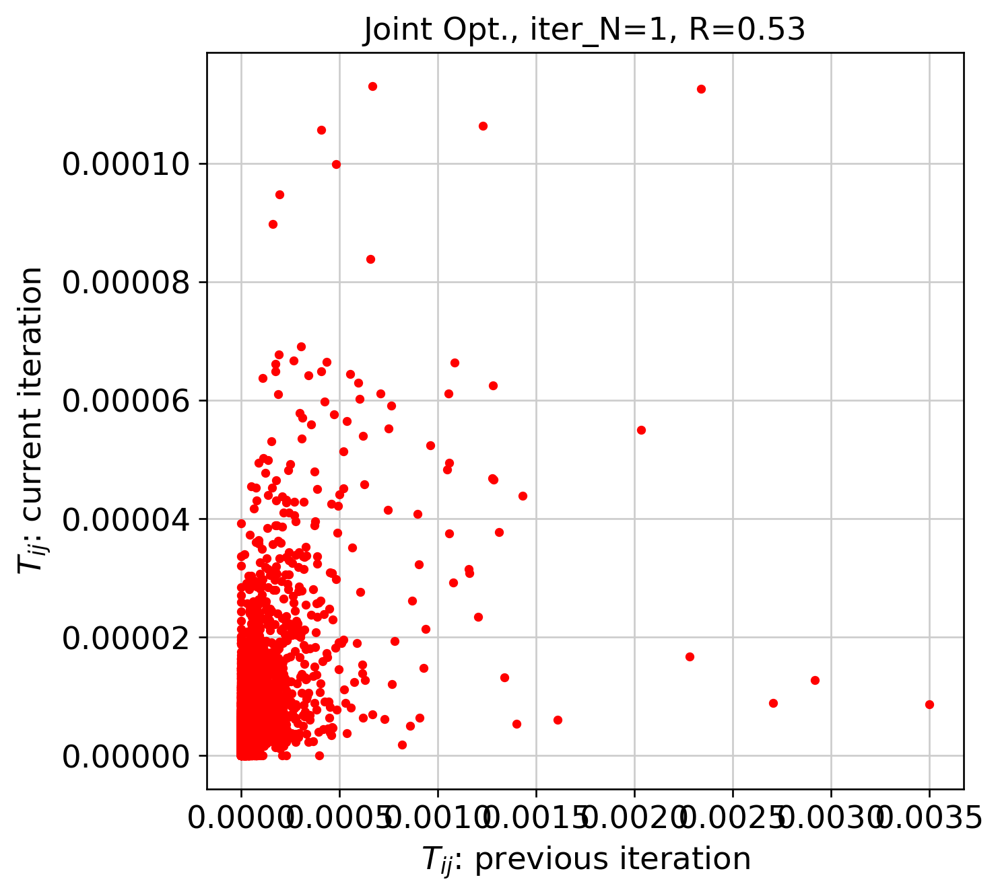

Finishing Joint Optimization, used time 117.6444525718689
-----------Total used time: 2701.0032856464386 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.39986753463745117
Smooth round: 2
--> Time elapsed: 0.3378324508666992
Smooth round: 3
--> Time elapsed: 2.4379875659942627
Smooth round: 4
--> Time elapsed: 9.238631010055542
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  9.980363845825195
Smooth round: 5
--> Time elapsed: 9.927582263946533
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.091256380081177
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.351314544677734
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.119049

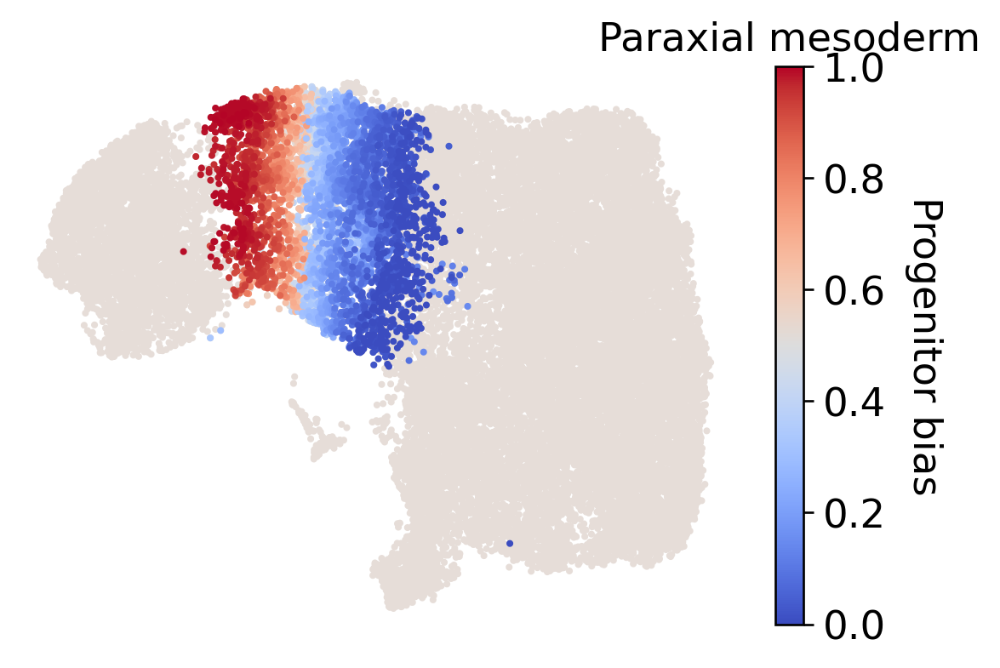

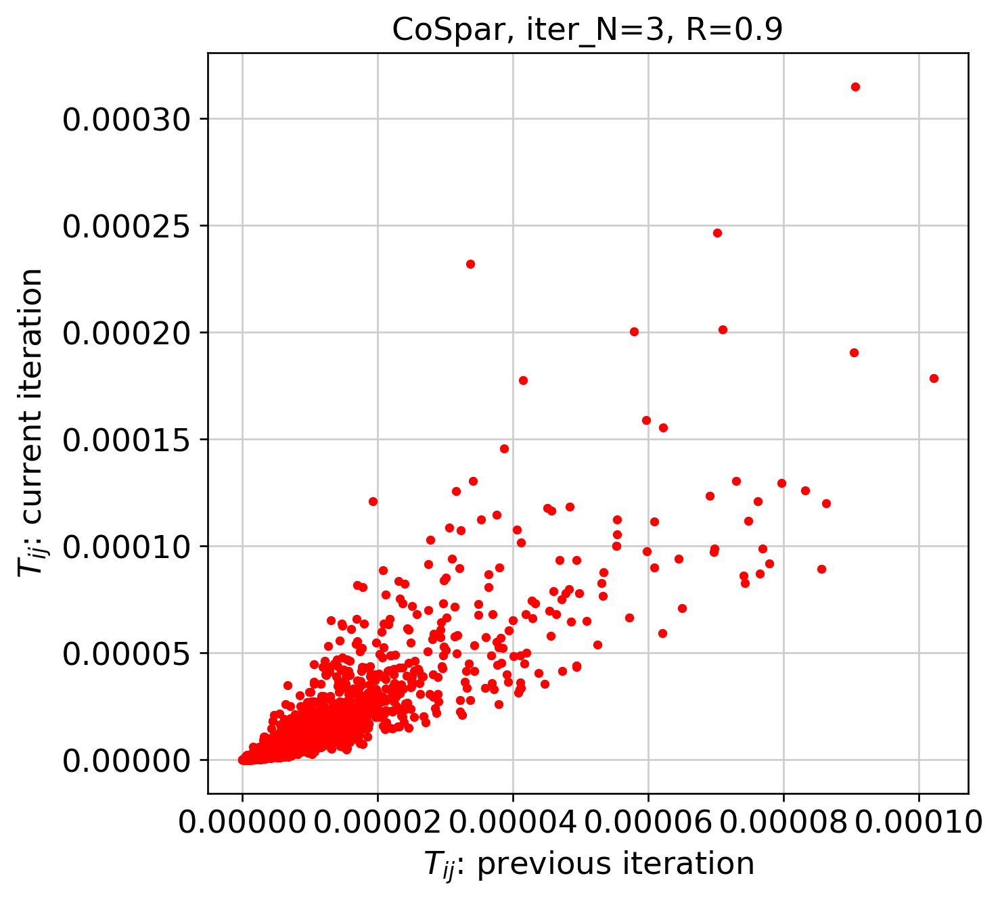

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.09750866889953613
--> Phase II: time elapsed --  0.25871825218200684


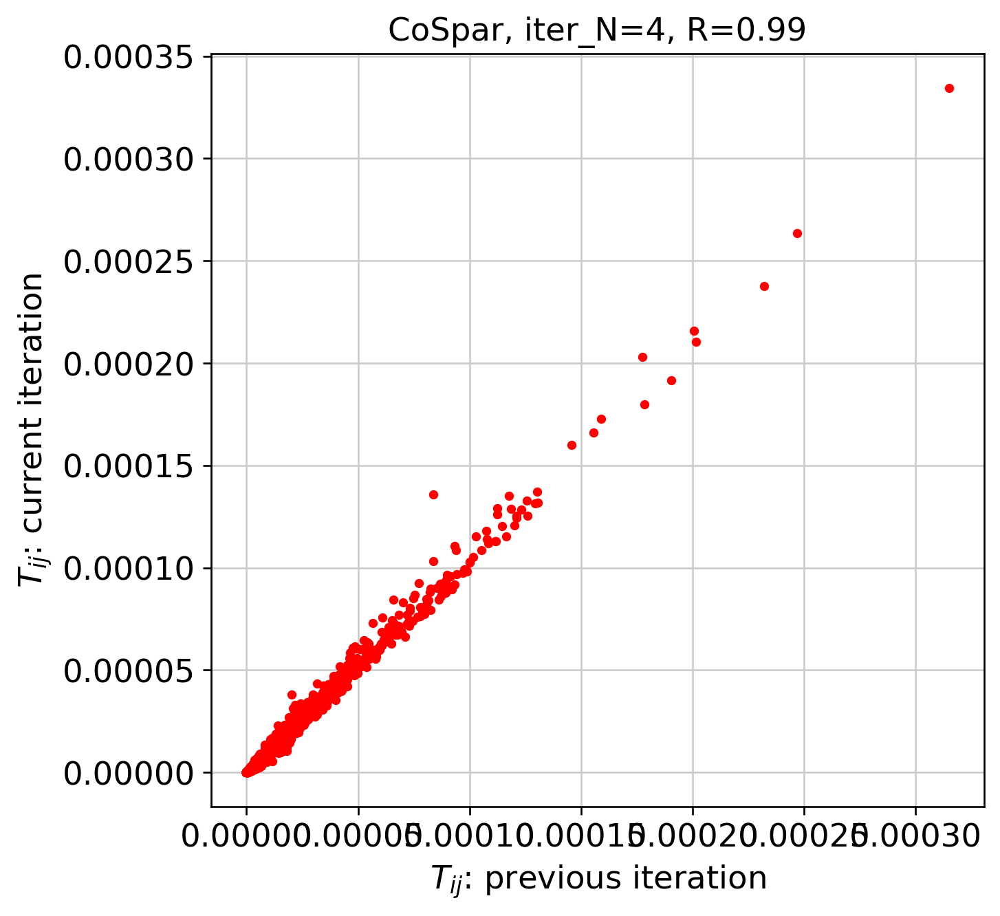

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.9359936714172363
--> Phase II: time elapsed --  1.8675401210784912
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


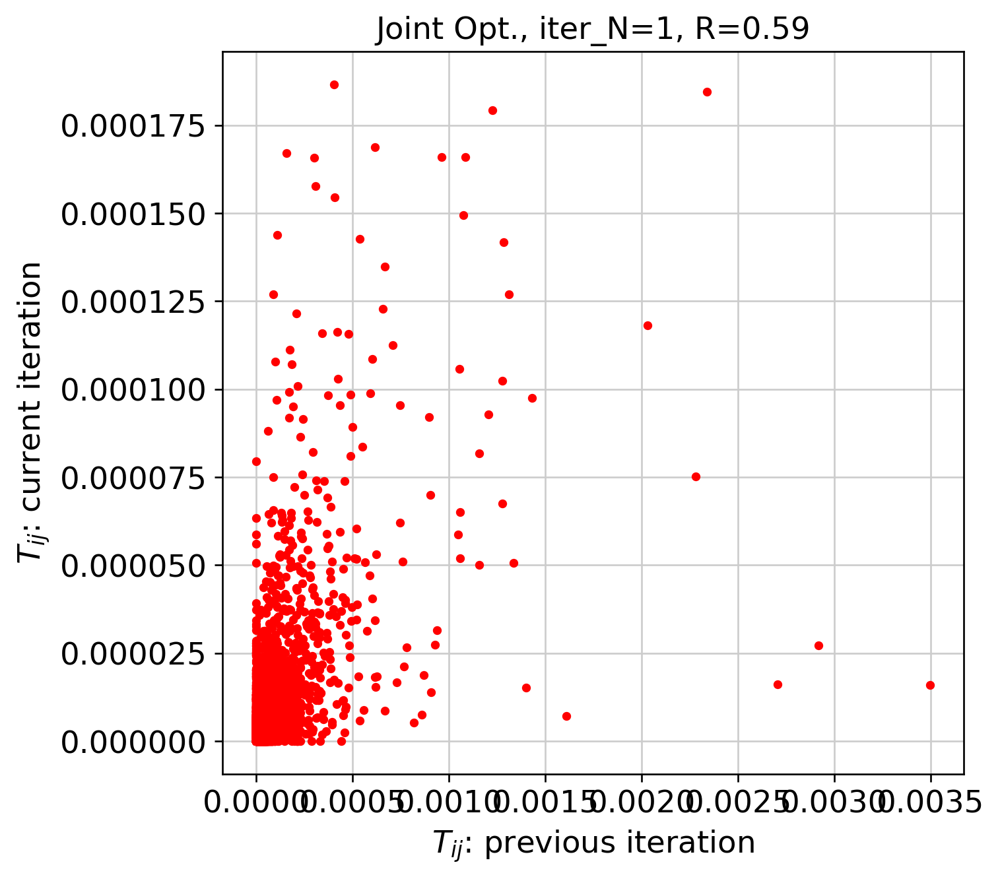

Finishing Joint Optimization, used time 49.83824324607849
-----------Total used time: 1529.7571675777435 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.4036531448364258
Smooth round: 2
--> Time elapsed: 0.34714174270629883
Smooth round: 3
--> Time elapsed: 2.4921343326568604
Smooth round: 4
--> Time elapsed: 9.405648946762085
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  10.102203369140625
Smooth round: 5
--> Time elapsed: 10.17665982246399
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  10.05701470375061
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.84244680404663
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.1190491

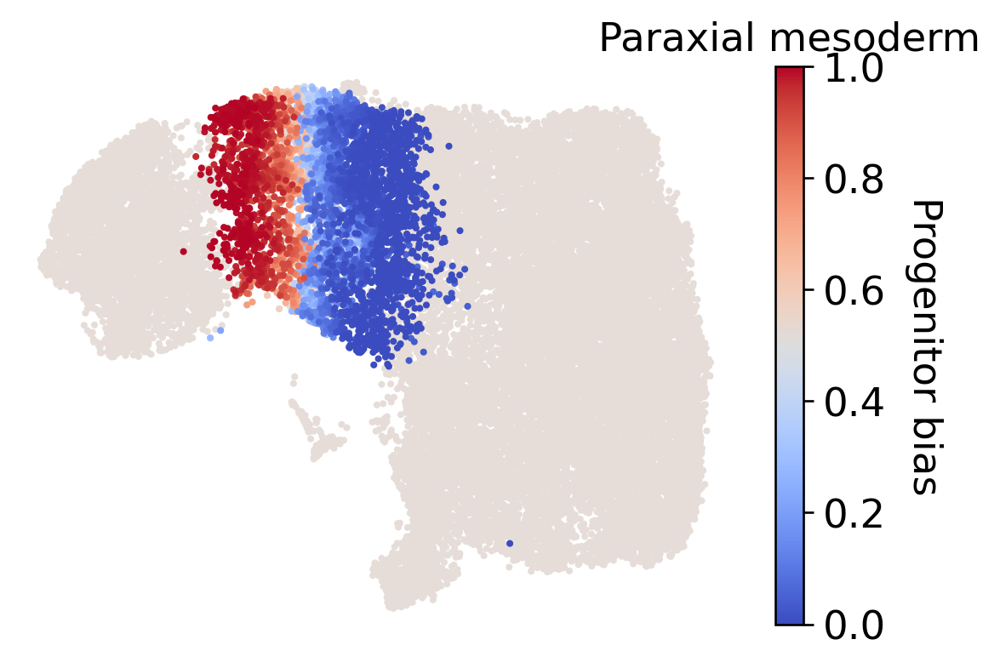

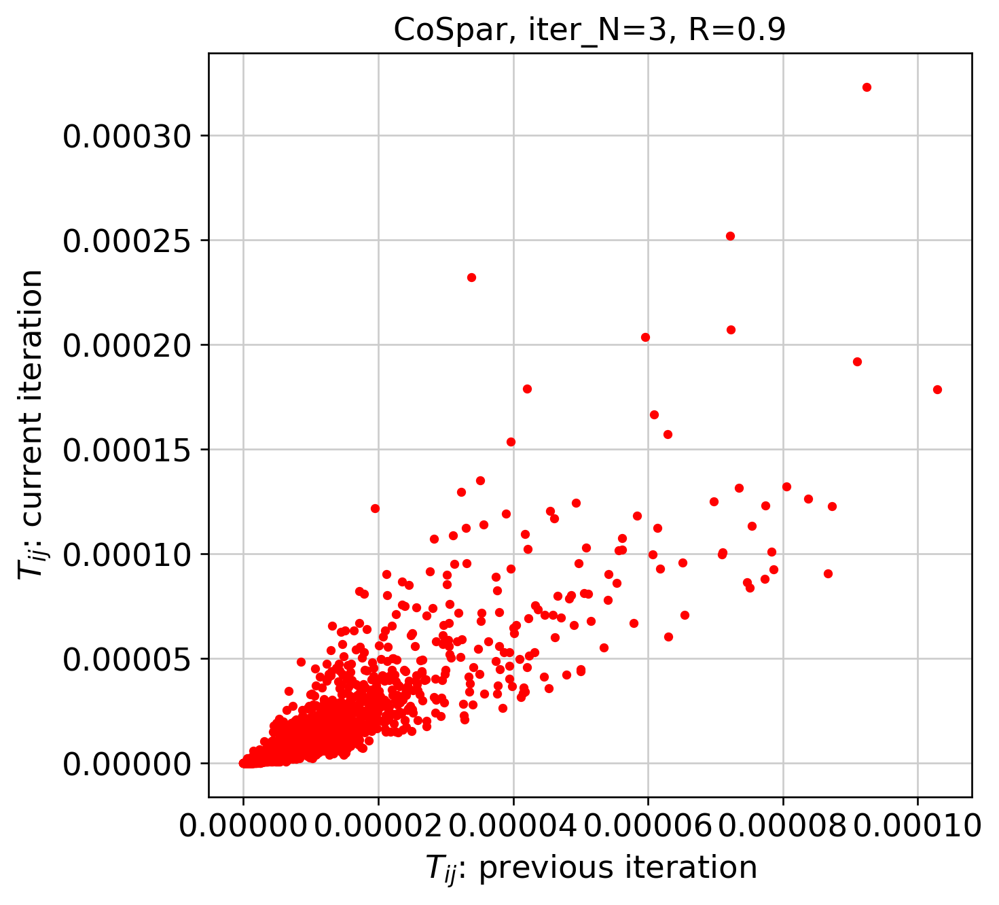

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.08147406578063965
--> Phase II: time elapsed --  0.24233078956604004


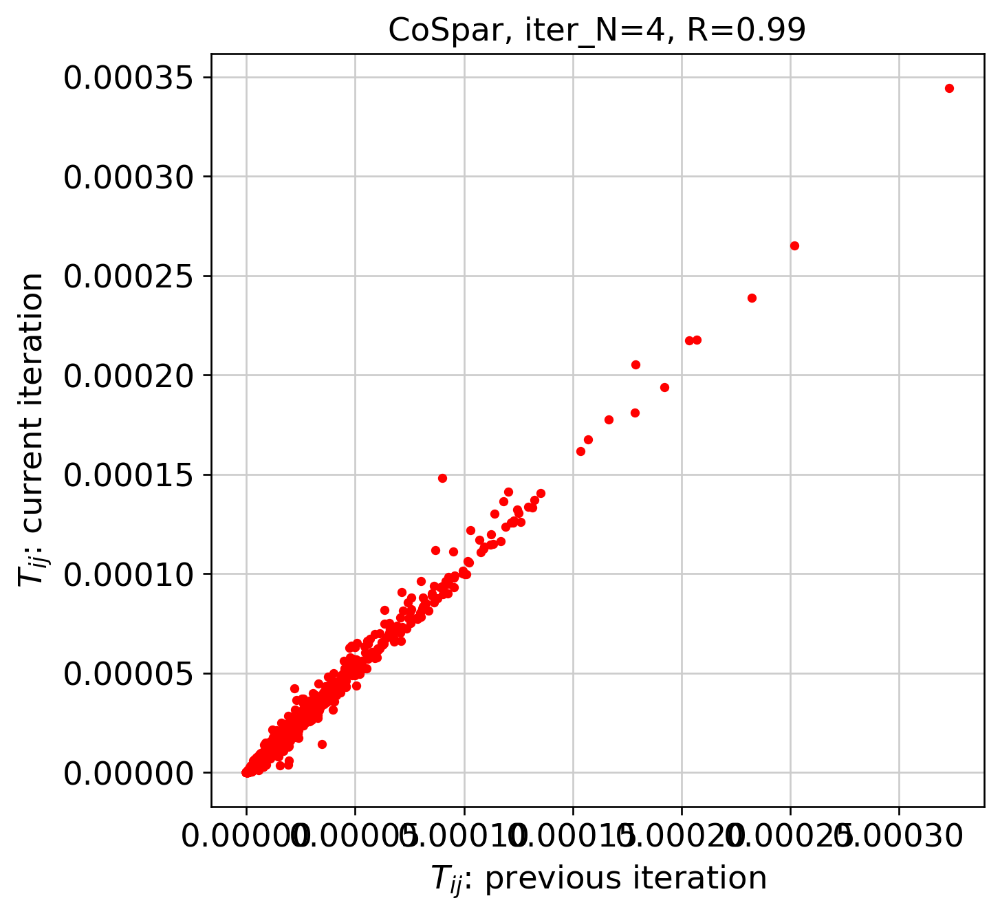

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.8671236038208008
--> Phase II: time elapsed --  1.7914812564849854
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


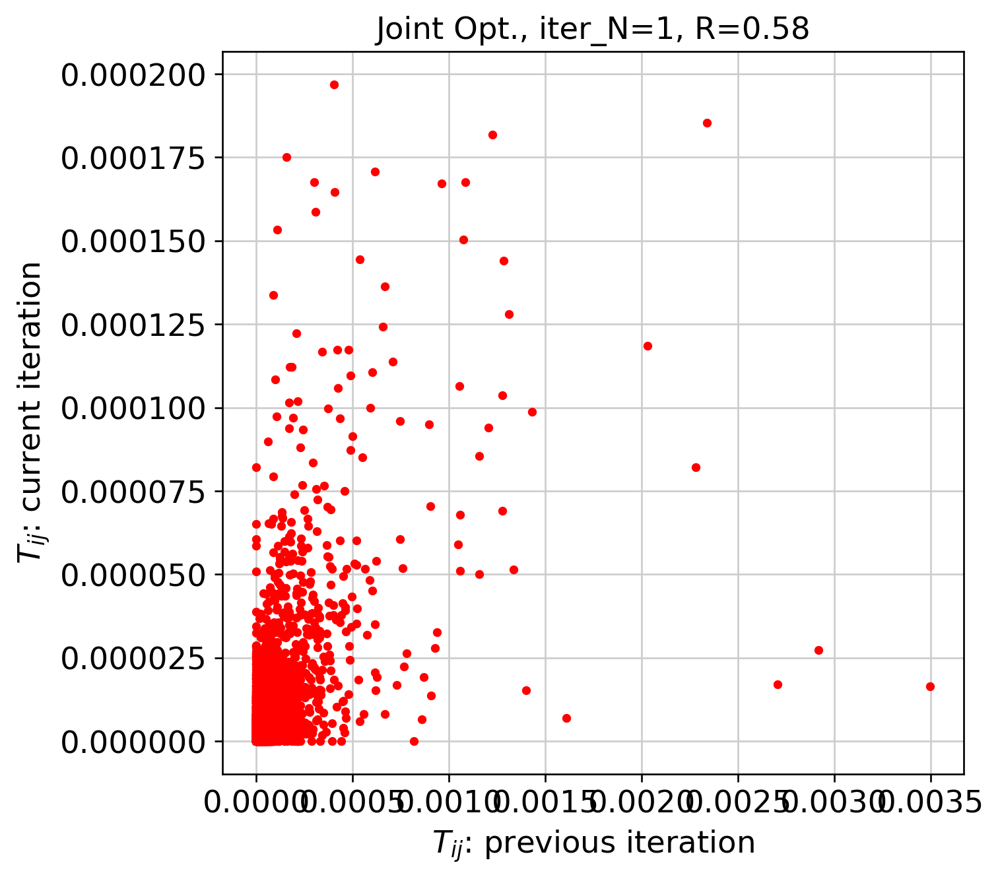

Finishing Joint Optimization, used time 49.60090756416321
-----------Total used time: 1531.334102153778 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


--------Infer transition map between initial time points and the later time one-------
--------Current initial time point: early--------
Step 0: Pre-processing and sub-sampling cells-------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.4141206741333008
Smooth round: 2
--> Time elapsed: 0.33945703506469727
Smooth round: 3
--> Time elapsed: 2.4648520946502686
Smooth round: 4
--> Time elapsed: 9.178926944732666
--> Orignal sparsity=0.16710669897471672, Thresholding
--> Final sparsity=0.060220404763095814
similarity matrix truncated (Smooth round=4):  10.230526685714722
Smooth round: 5
--> Time elapsed: 9.870261430740356
--> Orignal sparsity=0.1752211321908544, Thresholding
--> Final sparsity=0.0885806648885246
similarity matrix truncated (Smooth round=5):  9.95648193359375
--> Save the matrix at every 5 rounds
Smooth round: 6
--> Time elapsed: 13.28542160987854
--> Orignal sparsity=0.22459440033350814, Thresholding
--> Final sparsity=0.11904915

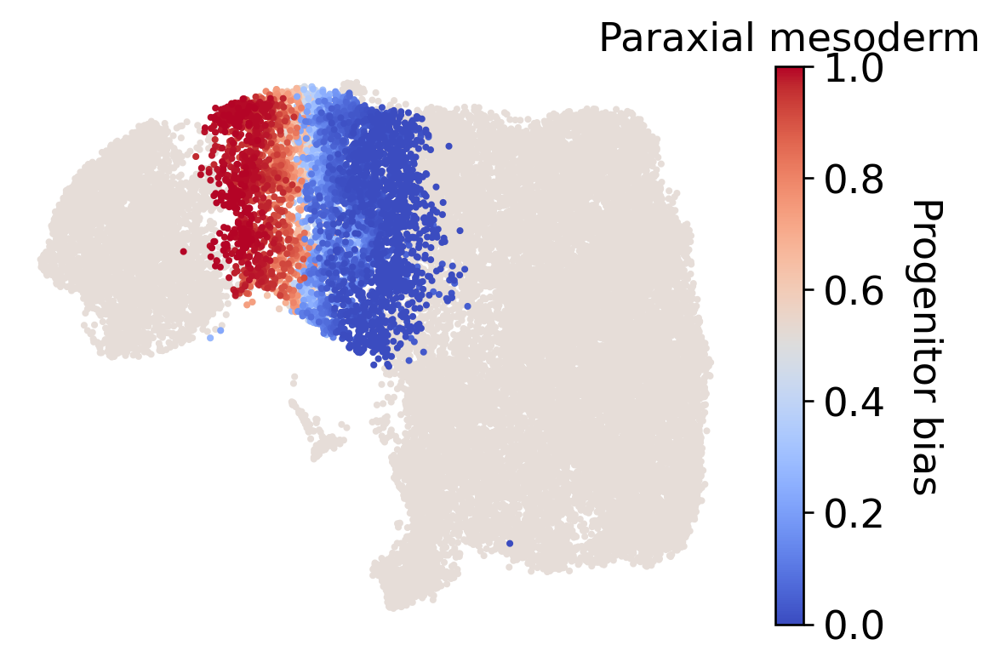

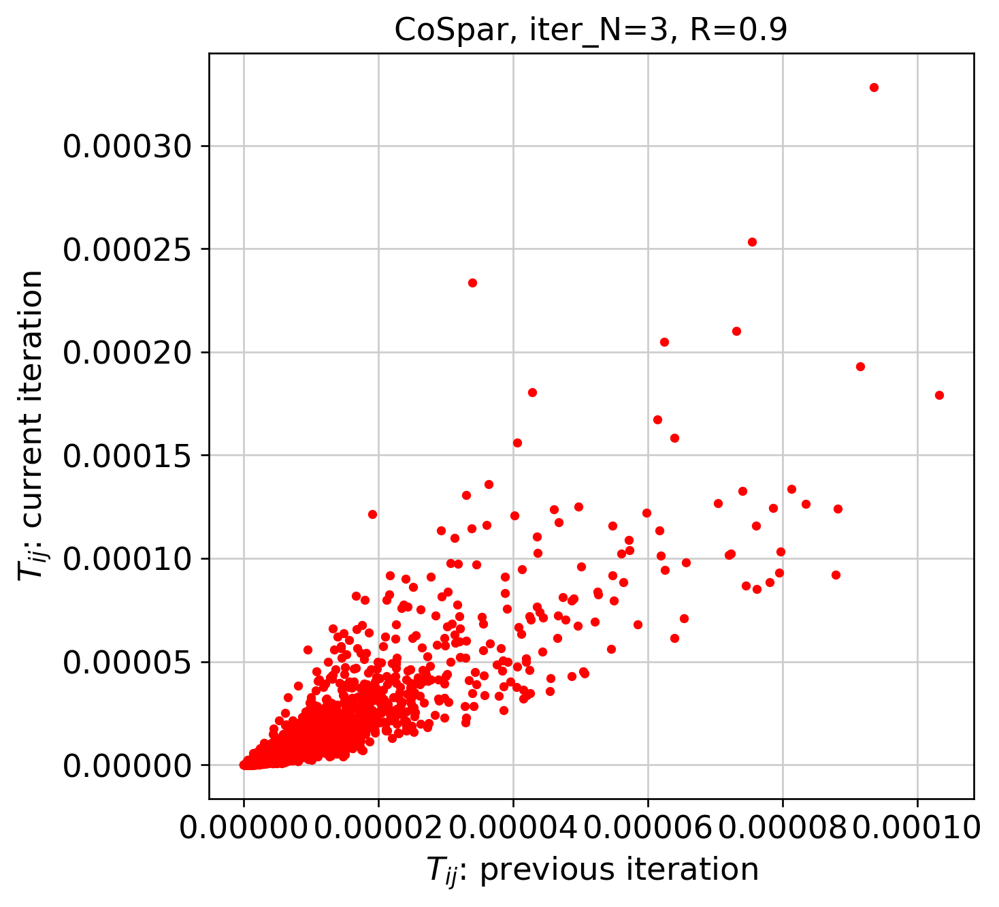

Iteration 4, Use smooth_round=5
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0
--> Start to smooth the refined clonal map
--> Phase I: time elapsed --  0.08131837844848633
--> Phase II: time elapsed --  0.24337363243103027


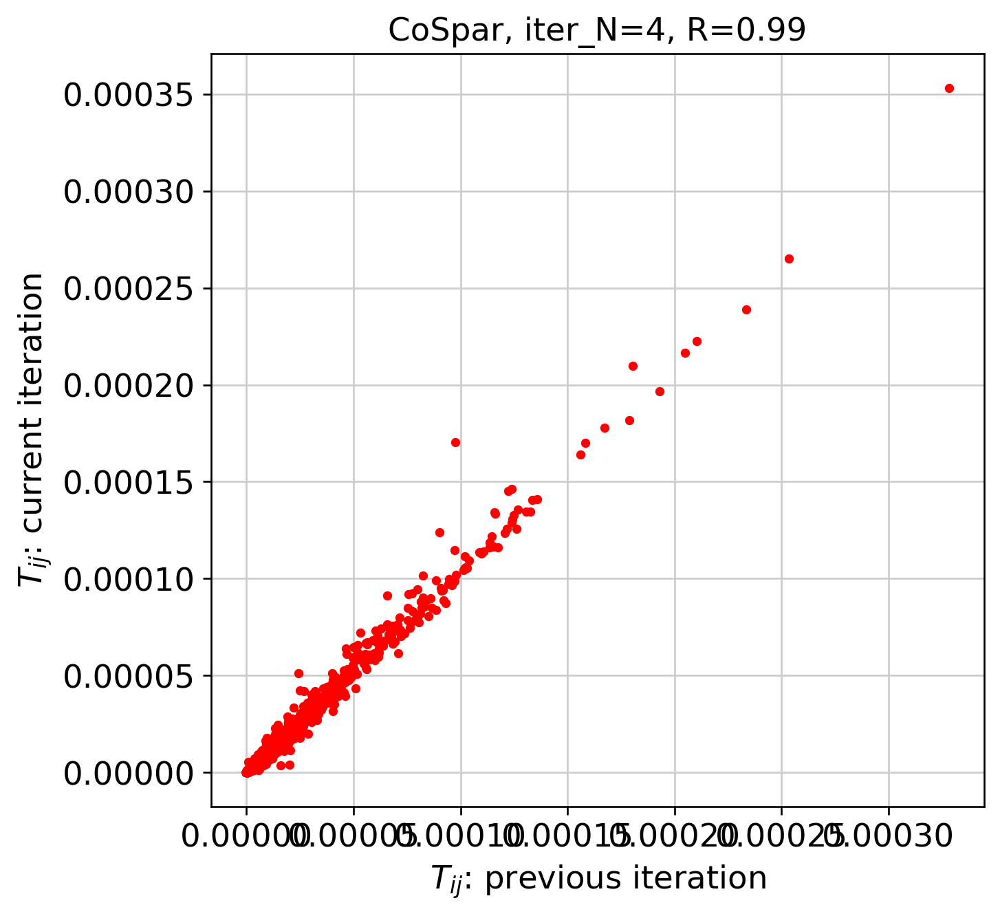

--> Final round of Smooth (to expand the state space of Tmap to include non-clonal states)
--> Phase I: time elapsed --  0.8162336349487305
--> Phase II: time elapsed --  1.7809786796569824
--> ----Intraclone transition map----
--> Clone normalization
--> Relative time point pair index: 0
--> Clone id: 0


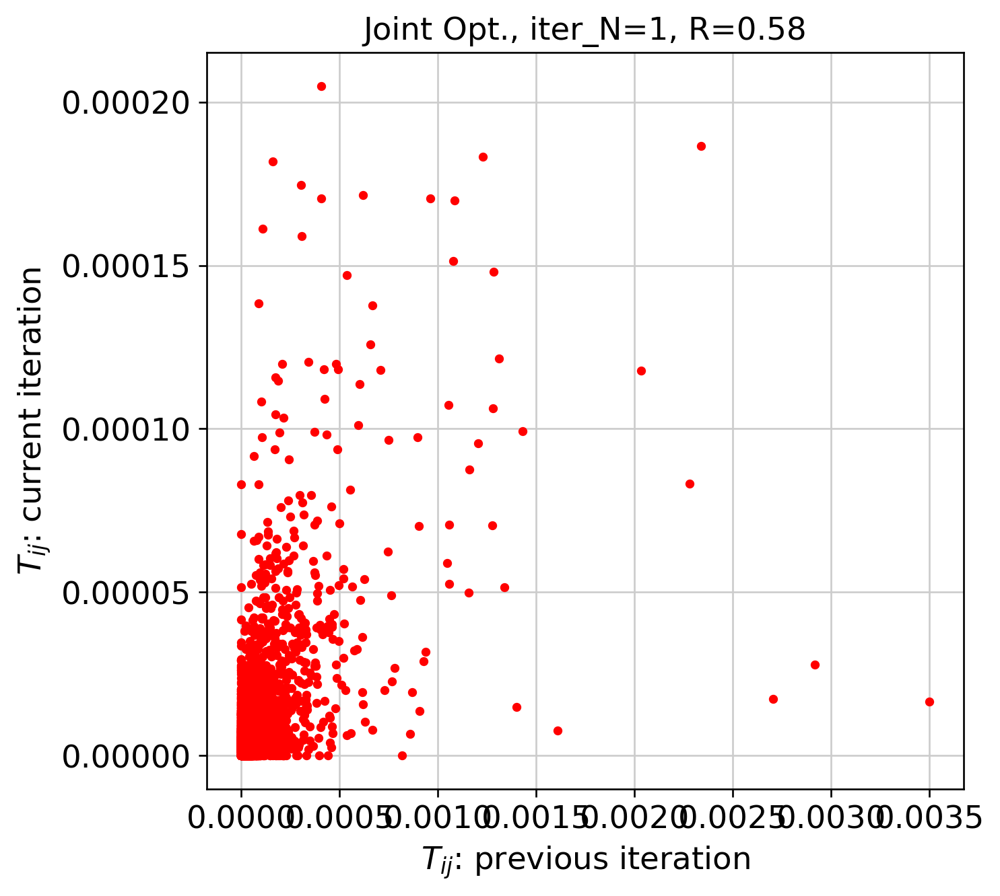

Finishing Joint Optimization, used time 50.004650592803955
-----------Total used time: 1507.8925924301147 s ------------
Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


... storing 'time_info' as categorical


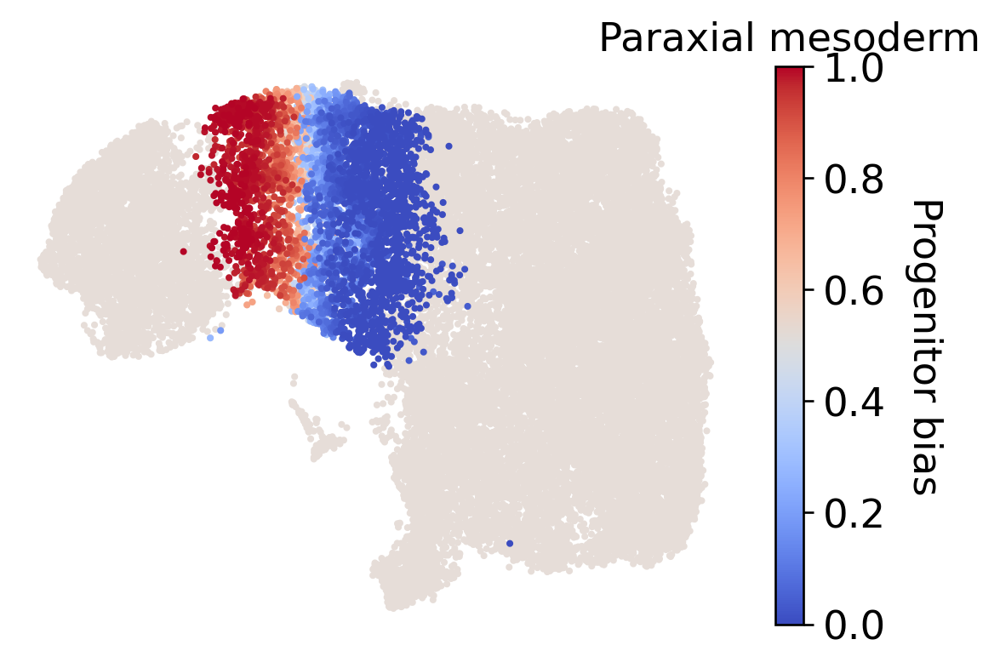

In [81]:
for i in ['GED','SPD']:
    for j in [[20,15,10],[15,10,5]]:
        for k in [0.1,0.15,0.2]:
            adata=cs.tmap.infer_Tmap_from_one_time_clones(adata_orig,initial_time_points='early',
                                                          later_time_point='late',initialize_method='OT',
                                                          compute_new=True,OT_cost=i,smooth_array=j,
                                                         sparsity_threshold=k)
            cs.tl.fate_bias(
                adata,
                selected_fates=['Paraxial mesoderm', "Spinal cord"],
                source="transition_map",
                pseudo_count=0,
                sum_fate_prob_thresh=0.1,
            )
            cs.pl.fate_bias(
                adata,
                selected_fates=['Paraxial mesoderm', "Spinal cord"],
                source="transition_map",
                plot_target_state=False,)
            adata.write_h5ad('/data/jiangjunyao/polyATAC/cospar_tuning/'+i+'_'+str(j)+'_'+str(k)+'.h5ad')


Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']


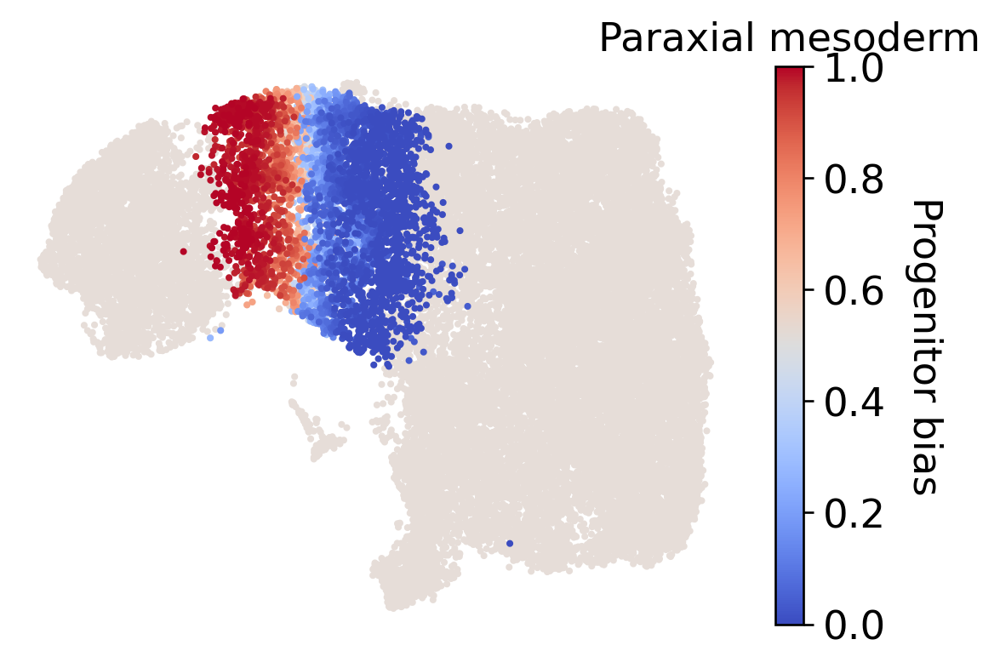

In [85]:
cs.tl.fate_bias(
    adata,
    selected_fates=['Paraxial mesoderm', "Spinal cord"],
    source="transition_map",
    pseudo_count=0,
    sum_fate_prob_thresh=0.1,
)
cs.pl.fate_bias(
    adata,
    selected_fates=['Paraxial mesoderm', "Spinal cord"],
    source="transition_map",
    plot_target_state=False,
)

Results saved at adata.obs['fate_map_transition_map_Paraxial mesoderm']
Results saved at adata.obs['fate_map_transition_map_Spinal cord']
Results saved at adata.obs['fate_bias_transition_map_Paraxial mesoderm*Spinal cord']
Results saved at adata.obs[f'progenitor_transition_map_Paraxial mesoderm'] and adata.obs[f'diff_trajectory_transition_map_Paraxial mesoderm']
Results saved at adata.obs[f'progenitor_transition_map_Spinal cord'] and adata.obs[f'diff_trajectory_transition_map_Spinal cord']


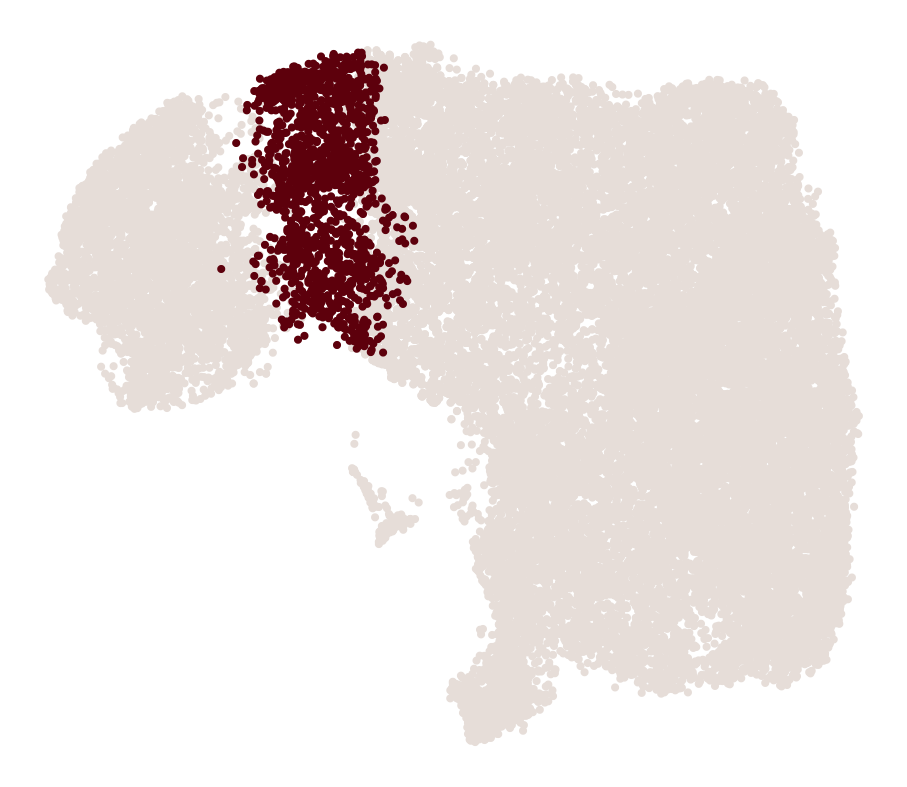

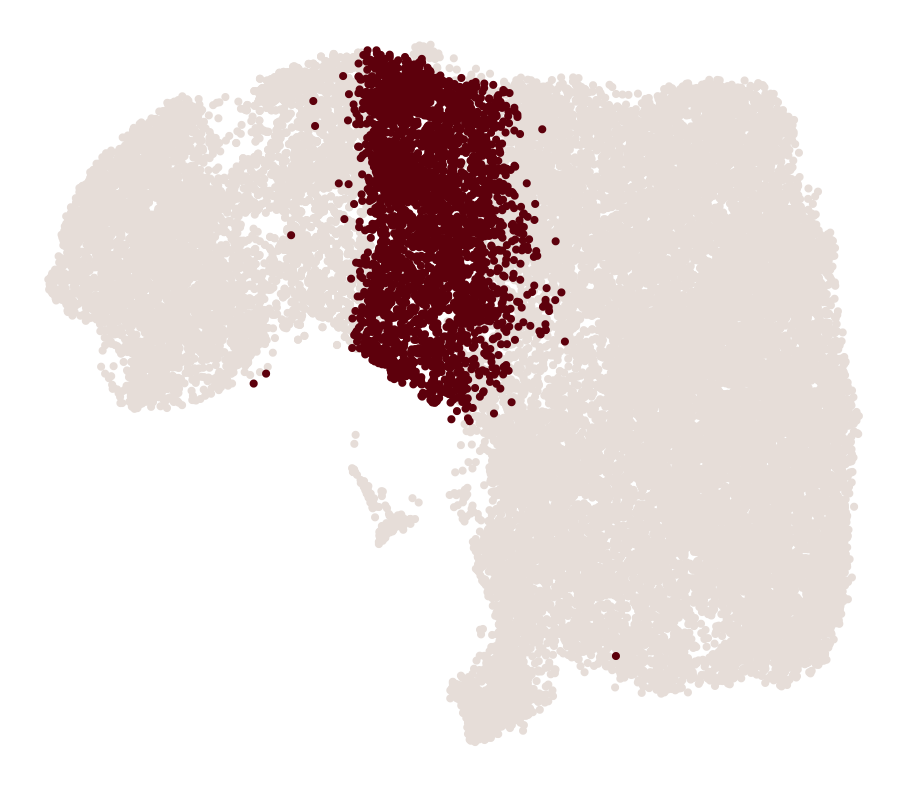

In [37]:
cs.tl.progenitor(adata,selected_fates=['Paraxial mesoderm', "Spinal cord"],
    source="transition_map")
cs.pl.progenitor(adata,selected_fates=['Paraxial mesoderm', "Spinal cord"],
    source="transition_map")

Use pre-computed fate map


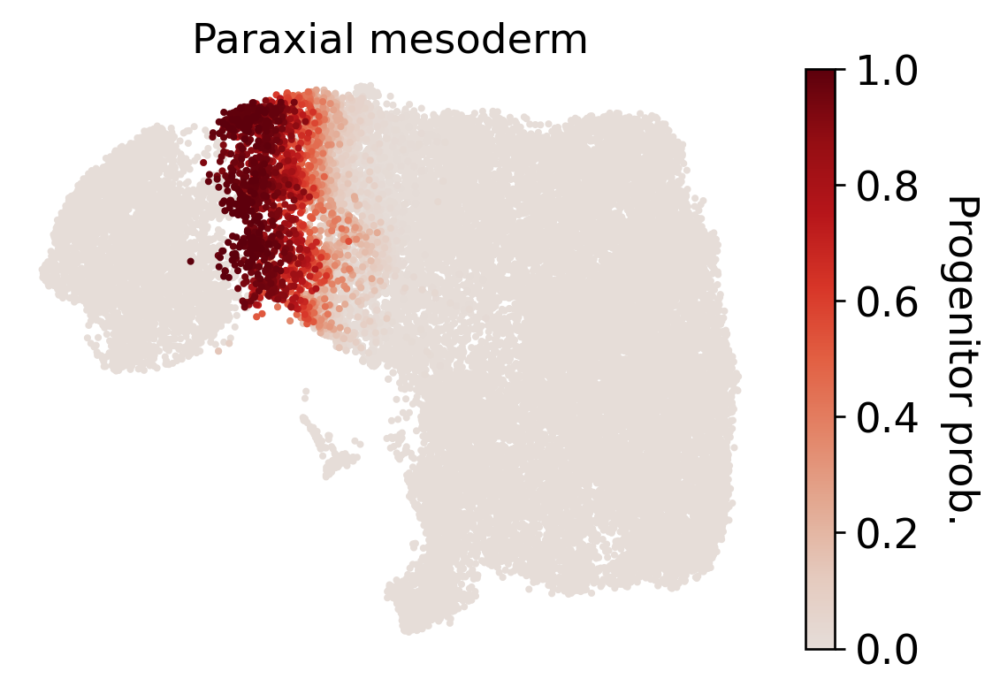

In [88]:
cs.tl.fate_map(adata,selected_fates=['Paraxial mesoderm'],
    source="transition_map")
cs.pl.fate_map(adata,selected_fates=['Paraxial mesoderm'],
    source="transition_map")

Use pre-computed fate map


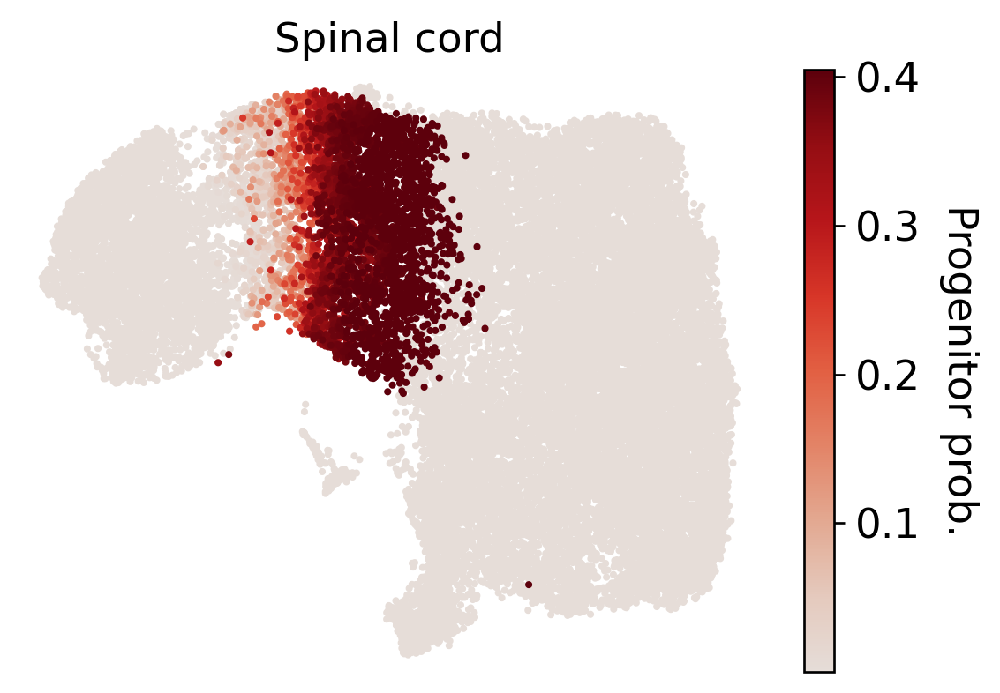

In [89]:
cs.tl.fate_map(adata,selected_fates=["Spinal cord"],
    source="transition_map")
cs.pl.fate_map(adata,selected_fates=["Spinal cord"],
    source="transition_map")

In [108]:
adata_nmp = adata[adata.obs.celltype=='Neuromesodermal progenitors']
adata_nmp.obs['Fate_bias']='other'
sel_idx_2=((adata_nmp.obs['fate_map_transition_map_Paraxial mesoderm']>0.4))
adata_nmp.obs.loc[sel_idx_2,'Fate_bias']='Paraxial_mesoderm_bias'
sel_idx_1=((adata_nmp.obs['fate_map_transition_map_Spinal cord']>0.4))
adata_nmp.obs.loc[sel_idx_1,'Fate_bias']='Spinal_cord_bias'

... storing 'Fate_bias' as categorical


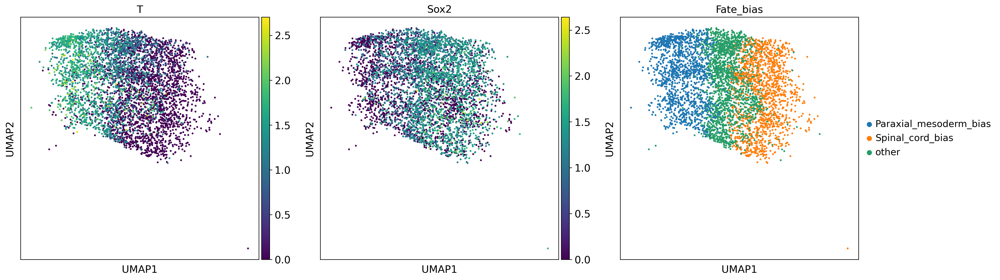

In [109]:
sc.pl.umap(adata_nmp,color=['T','Sox2','Fate_bias'])

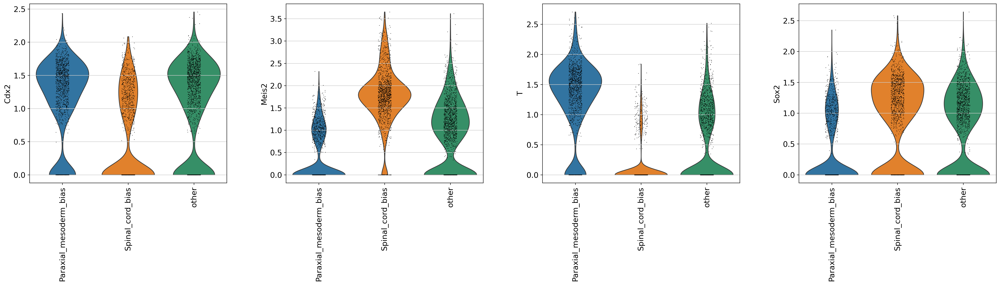

In [110]:
sc.pl.violin(adata_nmp,groupby='Fate_bias',keys=['Cdx2','Meis2','T','Sox2'],rotation=90)

In [125]:
adata_nmp.obs.to_csv('/data/jiangjunyao/polyATAC/nmp_final/only_nmp_meta.csv')

In [111]:
adata_nmp.obs['Fate_bias'].value_counts()

other                     1782
Spinal_cord_bias          1430
Paraxial_mesoderm_bias    1371
Name: Fate_bias, dtype: int64

In [124]:
adata_nmp.obs['Batch'].value_counts()

E8.5-Embryo1-Repeats2    505
E8.5-Embryo1-Repeats1    476
E8.5-Embryo2-Repeats2    452
E95_E55marker_Body-1     358
E95_E55marker_Body-2     356
E8.5-Embryo2-Repeats1    339
E9.0-Embryo1-Repeats3    330
e95                      279
E9.0-Embryo1-Repeats1    271
E9.0-Embryo1-Repeats2    237
mouse2_rep2              201
mouse2_rep3              181
mouse2_rep1              175
E8.0-Embryo1-Repeats1    160
mouse2_rep4              153
E95_E6marker_Body-2       55
E95_E6marker_Body-1       55
Name: Batch, dtype: int64